# DashBoard
[DashBoard Link](https://used-luxury-cars.herokuapp.com/)

# Index
1. [Webscraping](#Webscraping)  
2. [Load Data](#Load-Data)  
3. [Extract Features](#Extract-Features)  
4. [Missing Data & outliers](#Missing-Data-&-outliers)  
- [MPG](#MPG)  
- [Drivetrain](#Drivetrain)  
- [Fuel_type](#Fuel_type)  
- [Transmission_type](#Transmission_type)  
- [Cylinder](#Cylinder)  
- [Engine_size](#Engine_size)  
- [Gears](#Gears)  
- [Cylinder](#Cylinder)  
- [Boost](#Boost)  
- [Mileage](#Mileage)  
- [Price](#Price)   
5. [EDA & Visualization](#EDA-&-Visualization)  
- [Correlation](#Correlation)  
- [Categorical data into numerical](#Categorical-data-into-numerical)  
- [Correlation again](#Correlation-again)  
6. [Linear Regression](#Linear-Regression)  
- [Assumption 1 Target is normally disturbuted](#Assumption-1-Target-is-normally-disturbuted)  
- [Assumption 2 Relation between target and feature is linear](#Assumption-2-Relation-between-target-and-feature-is-linear)
- [Assumption 3 no high multicollinearity](#Assumption-3-no-high-multicollinearity)  
- [Model building & evaluation](#Model-building-&-evaluation)  
- [Model building & evaluation 2](#Model-building-&-evaluation-2)  
- [Model building & evaluation 3](#Model-building-&-evaluation-3)
- [Model building & evaluation 4](#Model-building-&-evaluation-4)
- [Choosing the model](#Choosing-the-model)  
7. [Conclusion](#Conclusion)  
- [Assumption 4 residuals are normally distributed](#Assumption-4-residuals-are-normally-distributed)  
- [Insight](#Insight)
- [Playing with the best model](#Playing-with-the-best-model)
- [Extras](#Extras)

# Webscraping

In [1]:
from bs4 import BeautifulSoup
import requests as req
import pandas as pd
from tqdm import tqdm
import regex as re
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def Extract_data(url):
    html= req.get(url)
    soup= BeautifulSoup(html.text, 'html.parser')
    data={'name':[], 'drivetrain':[], 'mpg':[], 'fuel_type':[], 'transmission':[],
         'engine':[], 'mileage':[], 'price':[]}
    
    for car in tqdm(soup.find_all('a', class_='vehicle-card-link js-gallery-click-link'), desc='Car listing'):
        car_html= req.get(f"https://www.cars.com{car.get('href')}")
        soup= BeautifulSoup(car_html.text, 'html.parser')
        data['name'].append(soup.find('h1', class_='listing-title').text.strip())
        data['drivetrain'].append(soup.find(class_='fancy-description-list').find_all('dd')[2].text.strip())
        try:
            data['mpg'].append( soup.find(class_='fancy-description-list').find_all('dd')[3].find('span', class_='sds-tooltip').find('span').text.strip() )
        except AttributeError as e:
            data['mpg'].append(None)
        data['fuel_type'].append(soup.find(class_='fancy-description-list').find_all('dd')[4].text.strip())
        data['transmission'].append(soup.find(class_='fancy-description-list').find_all('dd')[5].text.strip())
        data['engine'].append(soup.find(class_='fancy-description-list').find_all('dd')[6].text.strip())
        data['mileage'].append(soup.find(class_='fancy-description-list').find_all('dd')[9].text.strip())
        data['price'].append(soup.find('span', class_='primary-price').text.strip())
    return pd.DataFrame(data)

In [ ]:
#Note the webscraping is gonna take a long time ~5-6 hours

#BMW
url=f'https://www.cars.com/shopping/results/?page=1&page_size=100&dealer_id=&keyword=&list_price_max=&list_price_min=&makes[]=bmw&maximum_distance=all&mileage_max=&sort=best_match_desc&stock_type=used&year_max=&year_min=&zip='
df= Extract_data(url)
for i in range(2,38):
    url=f'https://www.cars.com/shopping/results/?page=1&page_size=100&dealer_id=&keyword=&list_price_max=&list_price_min=&makes[]=bmw&maximum_distance=all&mileage_max=&sort=best_match_desc&stock_type=used&year_max=&year_min=&zip='
    df= pd.concat([df, Extract_data(url)])

df['brand']='BMW'

#Merc
url=f'https://www.cars.com/shopping/results/?page=1&page_size=100&list_price_max=&makes[]=mercedes_benz&maximum_distance=all&models[]=&stock_type=used&zip='
df2= Extract_data(url)
for i in range(2,38):
    url=f'https://www.cars.com/shopping/results/?page={i}&page_size=100&list_price_max=&makes[]=mercedes_benz&maximum_distance=all&models[]=&stock_type=used&zip='
    df2= pd.concat([df, Extract_data(url)])
    
df2['brand']='Merc'  

#Audi
url=f'https://www.cars.com/shopping/results/?page=1&page_size=100&list_price_max=&makes[]=audi&maximum_distance=all&models[]=&stock_type=used&zip='
df3= Extract_data(url)
for i in range(2,38):
    url=f'https://www.cars.com/shopping/results/?page={i}&page_size=100&list_price_max=&makes[]=audi&maximum_distance=all&models[]=&stock_type=used&zip='
    df3= pd.concat([df, Extract_data(url)])
    
df3['brand']='Audi'

#save data
df= pd.concat([df, df2, df3])
df.reset_index(drop=True, inplace=True)
df.to_csv('used_cars.csv', index=False)

Car listing:  13%|█▎        | 13/100 [00:29<03:16,  2.26s/it]

# Load Data

In [459]:
df= pd.read_csv('used_cars.csv')
df.head()

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand
0,2018 Audi A3 2.0T Premium,All-wheel Drive,24–31,Gasoline,6-Speed Automatic with Auto-Shift,2.0L I4 16V GDI DOHC Turbo,"33,724 mi.","$26,139",Audi
1,2016 Audi A6 3.0T TDI Prestige,All-wheel Drive,25–38,Diesel,8-Speed Automatic,3.0L V6 24V DDI DOHC Turbo Diesel,"39,407 mi.","$34,600",Audi
2,2019 Audi Q8 3.0T Premium,All-wheel Drive,17–22,Hybrid,8-Speed Automatic,3.0L V6 24V GDI DOHC Turbo Hybrid,"26,800 mi.","$65,903",Audi
3,2018 Audi SQ5 3.0T Premium Plus,All-wheel Drive,19–24,Gasoline,8-Speed Automatic,3.0L V6 24V GDI DOHC Turbo,"30,362 mi.","$43,950",Audi
4,2018 Audi Q7 3.0T Prestige,All-wheel Drive,19–25,Gasoline,8-Speed Automatic,3.0L V6 24V GDI DOHC Supercharged,"48,755 mi.","$48,500",Audi


In [460]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10868 entries, 0 to 10867
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   name          10868 non-null  object
 1   drivetrain    10868 non-null  object
 2   mpg           10602 non-null  object
 3   fuel_type     10868 non-null  object
 4   transmission  10868 non-null  object
 5   engine        10868 non-null  object
 6   mileage       10868 non-null  object
 7   price         10868 non-null  object
 8   brand         10868 non-null  object
dtypes: object(9)
memory usage: 764.3+ KB


## Comments:  
Cleaning is requaired before performing EDA:  
1.All columns are string type, need to convert numercal columns into int/float.  
2.Deal with missing values in the mpg column.  

# Extract Features

In [461]:
# Step 1: Extract the year from the name column
df['year']= df['name'].apply(lambda x: int(x.split()[0]))

#Step 2: Extract the engine size from the engine column
#Note: 0.0 means the car is Electric
df['engine_size']= df['engine'].apply(lambda x: float(re.findall('[0-9]+\.[0-9]+', x)[0]) if re.findall('[0-9]+\.[0-9]+', x) else 0.0)

#Step 3: Extract the number of cylinders from the engine column
#Note: 0 means the car is Electric
df['cylinders']=df['engine'].apply(lambda x: int(re.findall('I-?[0-9]+', x)[0].replace("I", "").replace("-", "")) if re.findall('I-?[0-9]+', x) else ( int(re.findall('V-?[0-9]+', x)[0].replace("V", "").replace("-", "")) if re.findall('V-?[0-9]+', x) else 0) )

#Step 4: Extract transmission_type from transmission column
df['transmission_type']= df['transmission'].apply(lambda x : re.findall('[A a][U u][T t][O o][M m][A a][T t][I i][C c]', x)[0].lower() if re.findall('[A a][U u][T t][O o][M m][A a][T t][I i][C c]', x) else ( re.findall('[M m][A a][N n][U u][A a][L l]', x)[0].lower() if re.findall('[M m][A a][N n][U u][A a][L l]', x) else None ) )

#Step 5: Extract number of gears from transmission column
df['gears']= df['transmission'].apply(lambda x : int(re.findall('[0-9]+', x)[0]) if re.findall('[0-9]+', x) else None )

#step 6: Convert price to float 
df['price']= df['price'].apply(lambda x : float(x.replace('$','').replace(',','')) if x!="Not Priced" else None)

#step 7: Convert mileage to int 
df['mileage']= df['mileage'].apply(lambda x : int(x.replace('mi.','').replace(',','')) )

#step 8: Extract boost from the engine column 
df['boost']= df['engine'].apply(lambda x : re.findall('[T t][U u][R r][B b][O o]', x)[0].lower() if re.findall('[T t][U u][R r][B b][O o]', x) else ( re.findall('[S s][U u][P p][E e][R r][C c][H h][A a][R r][G g][E e][D d]', x)[0].lower() if re.findall('[S s][U u][P p][E e][R r][C c][H h][A a][R r][G g][E e][D d]', x) else "none" ) )

#step 9: Extract drivetrain (AWD, RWD, FWD) from the drivetrain column 
df['drivetrain']= df['drivetrain'].apply(lambda x: 'RWD' if x=='Rear-wheel Drive' or x=='Rear Wheel Drive' else ('AWD' if x=='All-wheel Drive' or x=='Four-wheel Drive' else ('FWD' if x=='Front-wheel Drive' else None)) )

#step 10: Group different fuel names into common groups (Gasoline, Diesel, Hybrid, Electric)
df['fuel_type']= df['fuel_type'].apply(lambda x: 'Gasoline' if x in ['Gasoline', 'E85 Flex Fuel', 'Flexible Fuel', 'Gasoline Fuel'] else (x if x in ['Hybrid', 'Diesel', 'Electric'] else None))

#step 11: get avg mpg (low+high/2) from mpg column
df['mpg']= df['mpg'].astype(str).apply(lambda x : (int(x.split('–')[0]) + int(x.split('–')[1]))/2.0 if  len(x.split('–'))==2 else (float(x) if x.isdigit() else None))

#step 12: get model name from name
df['model']= df['name'].apply(lambda x: x.split('Audi')[1] if len(x.split('Audi'))>1 else (x.split('BMW')[1] if len(x.split('BMW'))>1 else (x.split('Mercedes-Benz')[1] if len(x.split('Mercedes-Benz'))>1 else x)))

In [462]:
df.describe()

,mpg,mileage,price,year,engine_size,cylinders,gears
count,10602.000000,10868.000000,10866.000000,10868.000000,10868.000000,10868.000000,10374.000000
mean,31.770138,41470.186511,41111.539941,2017.165348,2.571494,5.000920,7.749470
std,475.632381,28058.723389,24297.349383,2.733288,0.865545,1.514993,0.967608
min,0.000000,112.000000,1795.000000,1997.000000,0.000000,0.000000,1.000000
25%,21.500000,21999.750000,28998.000000,2016.000000,2.000000,4.000000,7.000000
50%,24.500000,34453.000000,36997.000000,2018.000000,2.000000,4.000000,8.000000
75%,27.000000,52090.000000,46984.000000,2019.000000,3.000000,6.000000,8.000000
max,39006.000000,225305.000000,399800.000000,2022.000000,6.600000,12.000000,9.000000


In [463]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10868 entries, 0 to 10867
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               10868 non-null  object 
 1   drivetrain         10203 non-null  object 
 2   mpg                10602 non-null  float64
 3   fuel_type          10852 non-null  object 
 4   transmission       10868 non-null  object 
 5   engine             10868 non-null  object 
 6   mileage            10868 non-null  int64  
 7   price              10866 non-null  float64
 8   brand              10868 non-null  object 
 9   year               10868 non-null  int64  
 10  engine_size        10868 non-null  float64
 11  cylinders          10868 non-null  int64  
 12  transmission_type  10833 non-null  object 
 13  gears              10374 non-null  float64
 14  boost              10868 non-null  object 
 15  model              10868 non-null  object 
dtypes: float64(4), int64(3

## Comments:  
Hmm, looks like we still have to deal with missing data if we want to start EDA and data visualization.  
Also there is a car with 39,006 mpg!!! we have to deal with it asap

# Missing Data & outliers  
- [MPG](#MPG)  
- [Drivetrain](#Drivetrain)  
- [Fuel_type](#Fuel_type)  
- [Transmission_type](#Transmission_type)  
- [Cylinder](#Cylinder)  
- [Engine_size](#Engine_size)  
- [Gears](#Gears)  
- [Cylinder](#Cylinder)  
- [Boost](#Boost)  
- [Mileage](#Mileage)  
- [Price](#Price)
- [Back to top](#Index)

## MPG

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='mpg'>

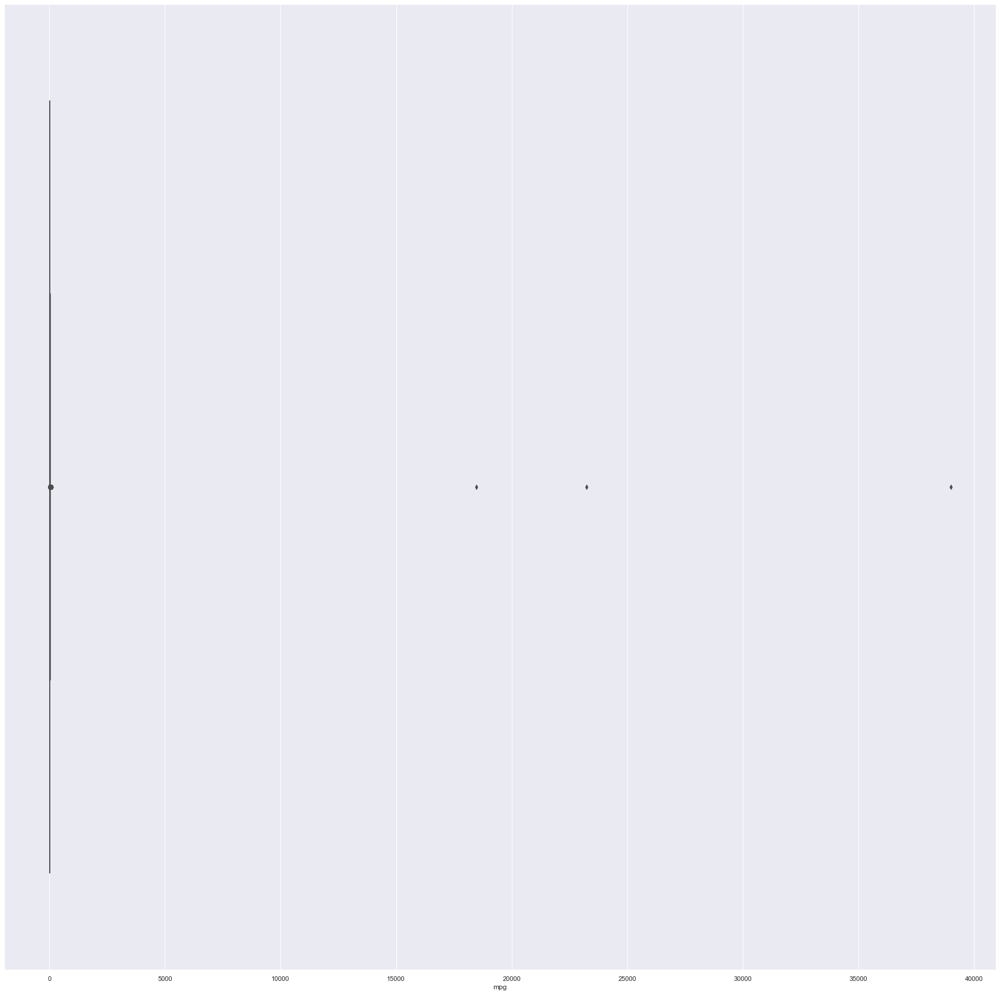

In [464]:
sns.boxplot(df['mpg'])

## Comments:
there is clearly 3 outliers which don not make sense lets see those rows

In [465]:
df[df['mpg']>10000]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
13,2018 Audi Q7 2.0T Premium Plus,AWD,18462.5,Gasoline,Automatic,Intercooled Turbo Premium Unleaded I-4 2.0 L/121,51499,36900.0,Audi,2018,2.0,4,automatic,NaN,turbo,Q7 2.0T Premium Plus
4600,2018 BMW M5 Base,AWD,39006.0,Gasoline,Automatic,Twin Turbo Premium Unleaded V-8 4.4 L/268,26734,77991.0,BMW,2018,4.4,8,automatic,NaN,turbo,M5 Base
10146,2017 Mercedes-Benz C-Class C 300 4MATIC,AWD,23242.0,Gasoline,Automatic,Intercooled Turbo Premium Unleaded I-4 2.0 L/121,41429,46455.0,Merc,2017,2.0,4,automatic,NaN,turbo,C-Class C 300 4MATIC


## Comments:
It seems those outliers are entry error from the website, to fix them I used the combined mpg for each vihacle, as follows:  
1. [audi](https://www.edmunds.com/audi/q7/2018/st-401717030/features-specs/) 21 mpg
2. [bmw](https://fueleconomy.gov/feg/noframes/39821.shtml) 17 mpg
3. [merc](https://www.edmunds.com/mercedes-benz/c-class/2017/mpg/) 19 mpg

In [466]:
df.iloc[[13,4600,10146],2]=[21,17,19]

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='mpg'>

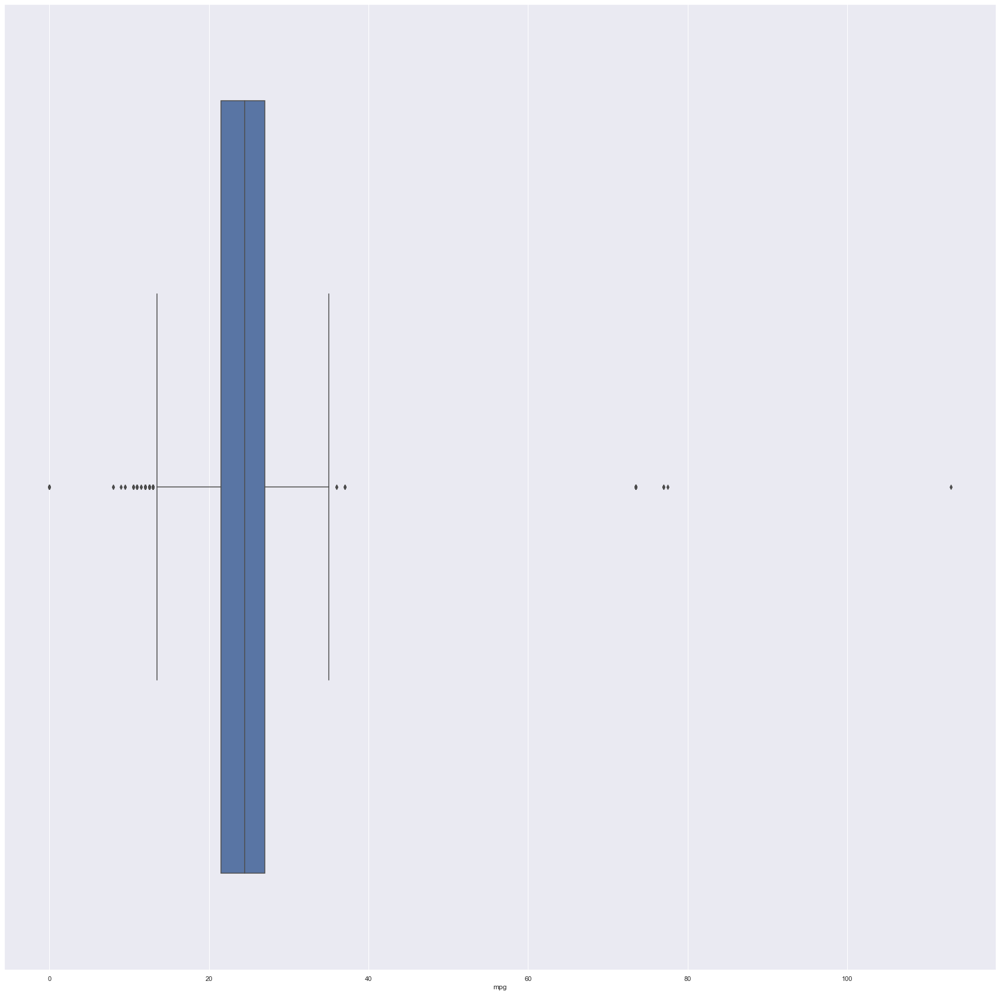

In [467]:
sns.boxplot(df['mpg'])

## Comments:
The plot looks better but still there is some outliers mainly the ones above 60 mpg and at 0 mpg, lets check those out.  

Note: even though a 113 is high it is a valid point [BMW i3](https://www.fueleconomy.gov/feg/noframes/41054.shtml)

In [468]:
df[df['mpg']>60]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
86,2020 Audi e-tron Premium Plus,AWD,77.0,Electric,1-Speed Automatic,Electric,10088,69000.0,Audi,2020,0.0,0,automatic,1.0,none,e-tron Premium Plus
268,2019 Audi e-tron Prestige,AWD,73.5,Electric,1-Speed Automatic,Electric,16613,66990.0,Audi,2019,0.0,0,automatic,1.0,none,e-tron Prestige
494,2021 Audi e-tron Premium Plus,AWD,77.0,Electric,1-Speed Automatic,Electric,6118,76991.0,Audi,2021,0.0,0,automatic,1.0,none,e-tron Premium Plus
644,2019 Audi e-tron Prestige,AWD,73.5,Electric,1-Speed Automatic,Electric,22692,64608.0,Audi,2019,0.0,0,automatic,1.0,none,e-tron Prestige
1094,2019 Audi e-tron Prestige,AWD,73.5,Electric,1-Speed Automatic,Electric,10634,67988.0,Audi,2019,0.0,0,automatic,1.0,none,e-tron Prestige
1467,2021 Audi e-tron Premium Plus,AWD,77.5,Electric,1-Speed Automatic,Electric,4358,77991.0,Audi,2021,0.0,0,automatic,1.0,none,e-tron Premium Plus
1702,2019 Audi e-tron Premium Plus,None,73.5,Electric,1-Speed Automatic,Electric,12378,59995.0,Audi,2019,0.0,0,automatic,1.0,none,e-tron Premium Plus
2159,2019 Audi e-tron Prestige,None,73.5,Electric,1-Speed Automatic,Electric,17875,63900.0,Audi,2019,0.0,0,automatic,1.0,none,e-tron Prestige
2440,2019 Audi e-tron Prestige,AWD,73.5,Electric,1-Speed Automatic,Electric,5447,69994.0,Audi,2019,0.0,0,automatic,1.0,none,e-tron Prestige
2441,2019 Audi e-tron Prestige,AWD,73.5,Electric,1-Speed Automatic,Electric,5450,68850.0,Audi,2019,0.0,0,automatic,1.0,none,e-tron Prestige


## Comments:  
Looks like all of the high mpg cars all electric, and based on the [2019 Audi e-tron Premium Plus mpg](https://www.fueleconomy.gov/feg/Find.do?action=sbs&id=41393) which is 74 thses numbers are correct, now lets check the 0 mpg cars

In [469]:
df[df['mpg']==0]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
56,2021 Audi e-tron Premium,AWD,0.0,Electric,Automatic,Electric,11493,64030.0,Audi,2021,0.0,0,automatic,NaN,none,e-tron Premium
1616,2018 Audi A3 e-tron Prestige,FWD,0.0,Hybrid,S Tronic 6-Speed Automatic,"Engine: 1.4 TFSI 4 CYL, PHEV, 204 HP",40290,32998.0,Audi,2018,1.4,0,automatic,6.0,none,A3 e-tron Prestige
2658,2022 Audi RS e-tron GT,AWD,0.0,Electric,Automatic,Electric,112,199991.0,Audi,2022,0.0,0,automatic,NaN,none,RS e-tron GT
3097,2020 Audi S8 4.0T,AWD,0.0,Hybrid,8-Speed Automatic,8 Cylinder Engine,13364,119895.0,Audi,2020,0.0,0,automatic,8.0,none,S8 4.0T
3406,2019 Audi e-tron Prestige,AWD,0.0,Electric,1-Speed Automatic,Electric Motor,17669,62999.0,Audi,2019,0.0,0,automatic,1.0,none,e-tron Prestige
6582,2004 BMW Z4 2.5i,RWD,0.0,Gasoline,Automatic,2.5L Straight 6 Cylinder Engine,80780,10995.0,BMW,2004,2.5,0,automatic,NaN,none,Z4 2.5i
7285,2012 Mercedes-Benz Sprinter 2500,RWD,0.0,Diesel,5-speed automatic transmission,3.0L DOHC 24-valve V6 turbo BlueTEC diesel engine,48178,29995.0,Merc,2012,3.0,6,automatic,5.0,turbo,Sprinter 2500
8871,2019 Mercedes-Benz GLC 350e Base 4MATIC,AWD,0.0,Hybrid,Automatic,Intercooled Turbo Gas/Electric I-4 2.0 L/121,16079,47995.0,Merc,2019,2.0,4,automatic,NaN,turbo,GLC 350e Base 4MATIC
10812,2014 Mercedes-Benz S-Class S 550,RWD,0.0,Gasoline,Automatic 7-Speed,8 Cylinder Engine,105429,33999.0,Merc,2014,0.0,0,automatic,7.0,none,S-Class S 550


## Comments:
Those look like entry error lets fix them tha same way as before, and since we are here lets fix other missing data as will.  
Sources:  
1. [2021 Audi e-tron Premium](https://www.carsdirect.com/2021/audi/e-tron/specs) 1gear
2. [2018 Audi A3 e-tron Prestige](https://www.fueleconomy.gov/feg/Find.do?action=sbs&id=39589)
3. [2022 Audi RS e-tron GT](https://www.carsdirect.com/2022/audi/e-tron-gt/specs) 2gears
4. [2020 Audi S8 4.0T](https://www.fuelly.com/car/audi/s8/2020?engineconfig_id=845&bodytype_id=&submodel_id=)
5. [2019 Audi e-tron Prestige](https://carbuzz.com/cars/audi/e-tron-suv/2019-audi-e-tron-prestige-quattro)
6. [2004 BMW Z4 2.5i](https://www.nadaguides.com/Cars/2004/BMW/Z-Series/Roadster-2D-Z4-2-5i/Specs)5gears
7. [2012 Mercedes-Benz Sprinter 2500](https://www.fuelly.com/car/mercedes-benz/sprinter_2500/2012?engineconfig_id=508&bodytype_id=&submodel_id=)
8. [2019 Mercedes-Benz GLC 350e Base 4MATIC](https://www.edmunds.com/mercedes-benz/glc-class/2019/st-401771890/features-specs/) 7gears
9. [2014 Mercedes-Benz S-Class S 550](https://www.edmunds.com/mercedes-benz/s-class/2014/mpg/)

In [470]:
#fix mpg
df.iloc[df[df['mpg']==0].index,2]=[77.5, 83, 70, 22.5,73.5 , 24, 19, 25, 20]

#fix gears
df.iloc[[56, 2658, 6582, 8871],13]=[1,2,5,7]

#fix cylenders
df.iloc[[1616, 3097, 6582, 10812],11]=[4, 8, 6, 8]

#fix engine size
df.iloc[[3097,10812],10]=[4.0, 4.7]

## Comments:
Now lets deal with the missing data.  
To get as much variance as we can we will impute the mean based on brand, fuel_type, and cylinders

In [471]:
df.iloc[df[df['mpg'].isnull()].index, 2]= df[df['mpg'].isnull()].apply(lambda x : df[ ( df['brand']==x['brand'] ) & ( df['fuel_type']==x['fuel_type'] ) & ( df['cylinders']==x['cylinders'] ) ]['mpg'].mean(), axis=1)

In [472]:
df[df['mpg'].isnull()]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
576,2018 Audi Q7 Prestige,None,NaN,None,Automatic,3.0L 3.0-liter TFSI V6 engine,17981,55782.0,Audi,2018,3.0,6,automatic,NaN,none,Q7 Prestige
593,2019 Audi S5 Prestige,None,NaN,None,Automatic,3.0 L 6,11453,58999.0,Audi,2019,3.0,0,automatic,NaN,none,S5 Prestige
1992,2019 Audi A6 3.0T Premium,None,NaN,None,Automatic,3.0L 3.0-liter TFSI V6 engine,14339,54999.0,Audi,2019,3.0,6,automatic,NaN,none,A6 3.0T Premium
2246,2018 Audi Q5 Premium Plus,None,NaN,None,Automatic,2.0L 2.0-liter TFSI four-cylinder engine,30139,35983.0,Audi,2018,2.0,0,automatic,NaN,none,Q5 Premium Plus
2295,2018 Audi Q5 2.0T,None,NaN,None,7-Speed Automatic S tronic,2 2.0L TFSI,26380,37900.0,Audi,2018,2.0,0,automatic,7.0,none,Q5 2.0T
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7169,2016 BMW X5 eDrive xDrive40e,AWD,NaN,Hybrid,8-Speed Automatic,2.0L I4 16V GDI DOHC Turbo Hybrid,73650,29752.0,BMW,2016,2.0,4,automatic,8.0,turbo,X5 eDrive xDrive40e
7204,2018 BMW 530e iPerformance,RWD,NaN,Hybrid,8-Speed Automatic,2.0L I4 16V GDI DOHC Turbo Hybrid,26936,36998.0,BMW,2018,2.0,4,automatic,8.0,turbo,530e iPerformance
7247,2018 BMW 530e iPerformance,RWD,NaN,Hybrid,8-Speed Automatic,2.0L I4 16V GDI DOHC Turbo Hybrid,82875,28995.0,BMW,2018,2.0,4,automatic,8.0,turbo,530e iPerformance
7271,2018 BMW X5 eDrive xDrive40e,AWD,NaN,Hybrid,8-Speed Automatic,2.0L I4 16V GDI DOHC Turbo Hybrid,36299,43961.0,BMW,2018,2.0,4,automatic,8.0,turbo,X5 eDrive xDrive40e


## Comments:
These cars have a lot of miising data for so lets impute them with the mean of each brand

In [473]:
df.iloc[df[df['mpg'].isnull()].index, 2]= df[df['mpg'].isnull()].apply(lambda x : df[ ( df['brand']==x['brand'] ) ]['mpg'].mean(), axis=1)

In [474]:
df[df['mpg'].isnull()]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model


## Drivetrain

In [475]:
print(f"BMW most used drivetrain: {df[(df['brand']=='BMW')]['drivetrain'].mode().values}")
print(f"Audi most used drivetrain: {df[df['brand']=='Audi']['drivetrain'].mode().values}")
print(f"Merc most used drivetrain: {df[df['brand']=='Merc']['drivetrain'].mode().values}")

BMW most used drivetrain: ['AWD']
Audi most used drivetrain: ['AWD']
Merc most used drivetrain: ['AWD']


## Comments:  
Since AWD is the most used drivetrain for all 3 brands use it to impute

In [476]:
df['drivetrain'].fillna('AWD', inplace=True)

## Fuel_type

In [477]:
df[df['fuel_type'].isnull()]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
576,2018 Audi Q7 Prestige,AWD,24.723955,None,Automatic,3.0L 3.0-liter TFSI V6 engine,17981,55782.0,Audi,2018,3.0,6,automatic,NaN,none,Q7 Prestige
593,2019 Audi S5 Prestige,AWD,24.723955,None,Automatic,3.0 L 6,11453,58999.0,Audi,2019,3.0,0,automatic,NaN,none,S5 Prestige
1992,2019 Audi A6 3.0T Premium,AWD,24.723955,None,Automatic,3.0L 3.0-liter TFSI V6 engine,14339,54999.0,Audi,2019,3.0,6,automatic,NaN,none,A6 3.0T Premium
2246,2018 Audi Q5 Premium Plus,AWD,24.723955,None,Automatic,2.0L 2.0-liter TFSI four-cylinder engine,30139,35983.0,Audi,2018,2.0,0,automatic,NaN,none,Q5 Premium Plus
2295,2018 Audi Q5 2.0T,AWD,24.723955,None,7-Speed Automatic S tronic,2 2.0L TFSI,26380,37900.0,Audi,2018,2.0,0,automatic,7.0,none,Q5 2.0T
2703,2021 Audi Q5 45 Premium Plus 4D Sport Utility,AWD,24.723955,None,Automatic,2.0L Turbocharged,10219,48999.0,Audi,2021,2.0,0,automatic,NaN,turbo,Q5 45 Premium Plus 4D Sport Utility
2756,2019 Audi Q5 2.0T Premium Plus,AWD,24.723955,None,7-Speed Automatic S tronic,2.0L 2.0-liter TFSI four-cylinder engine,27494,39980.0,Audi,2019,2.0,0,automatic,7.0,none,Q5 2.0T Premium Plus
3270,2018 Audi A4 2.0T Quattro Premium Plus,AWD,24.723955,None,7 speed automatic with auto-shift,2.0L 2.0-liter TFSI four-cylinder engine,37905,33997.0,Audi,2018,2.0,0,automatic,7.0,none,A4 2.0T Quattro Premium Plus
3312,2018 Audi A5 2.0T Premium,AWD,24.723955,None,Automatic,2.0L 2.0-liter TFSI four-cylinder engine,17973,45499.0,Audi,2018,2.0,0,automatic,NaN,none,A5 2.0T Premium
3434,2020 Audi Q3 S Line Premium 45 Tfsi Quattro,AWD,24.723955,None,Automatic,2.0L 4,11392,37985.0,Audi,2020,2.0,0,automatic,NaN,none,Q3 S Line Premium 45 Tfsi Quattro


## Comments:  
Fortunately all of them are Gasoline engines, so lets fiil them with Gasoline

In [478]:
df.iloc[df[df['fuel_type'].isnull()].index, 3]= 'Gasoline'

## Transmission_type

In [479]:
df[df['transmission_type'].isnull()]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
704,2014 Audi Q7 3.0 TDI Premium,AWD,23.500000,Diesel,8-SPEED A/T,V6 Cylinder Engine,59134,27995.0,Audi,2014,0.0,6,None,8.0,none,Q7 3.0 TDI Premium
971,2009 Audi A4 2.0T Premium quattro,AWD,26.000000,Gasoline,6-Speed,4 Cylinder Engine,104799,7995.0,Audi,2009,0.0,0,None,6.0,none,A4 2.0T Premium quattro
1173,2012 Audi A6 2.0T Premium,FWD,16.500000,Gasoline,Variable,Turbocharged Gas I4 2.0L/121,92374,15999.0,Audi,2012,2.0,4,None,NaN,turbo,A6 2.0T Premium
1313,2018 Audi A4 Premium Plus,FWD,32.000000,Gasoline,7-Speed S tronic -inc,Engine: 2.0L TFSI I4 DOHC -inc: Audi Valvelift...,37090,28998.0,Audi,2018,2.0,4,None,7.0,none,A4 Premium Plus
2048,2005 Audi A4 1.8T quattro,AWD,25.664764,Gasoline,–,1.8L I4 20V MPFI DOHC Turbo,72956,1795.0,Audi,2005,1.8,4,None,NaN,turbo,A4 1.8T quattro
3628,2010 BMW 535 i xDrive,AWD,20.500000,Gasoline,–,3.0L I6 24V GDI DOHC Twin Turbo,61800,13949.0,BMW,2010,3.0,6,None,NaN,turbo,535 i xDrive
3669,2017 BMW M2 Base,RWD,22.000000,Gasoline,–,3.0L I6 24V GDI DOHC Turbo,70730,38599.0,BMW,2017,3.0,6,None,NaN,turbo,M2 Base
3690,2013 BMW 328 i,RWD,21.500000,Gasoline,–,3.0L I6 24V MPFI DOHC,59920,20880.0,BMW,2013,3.0,6,None,NaN,none,328 i
3715,2017 BMW 340 i xDrive,AWD,26.000000,Gasoline,–,3.0L I6 24V GDI DOHC Turbo,42016,35895.0,BMW,2017,3.0,6,None,NaN,turbo,340 i xDrive
3764,2015 BMW M4 Base,RWD,21.500000,Gasoline,–,3.0L I6 24V GDI DOHC Twin Turbo,70995,40895.0,BMW,2015,3.0,6,None,NaN,turbo,M4 Base


In [480]:
print(f"BMW most used transmission_type: {df[(df['brand']=='BMW')]['transmission_type'].mode().values}")
print(f"Audi most used transmission_type: {df[df['brand']=='Audi']['transmission_type'].mode().values}")
print(f"Merc most used transmission_type: {df[df['brand']=='Merc']['transmission_type'].mode().values}")

BMW most used transmission_type: ['automatic']
Audi most used transmission_type: ['automatic']
Merc most used transmission_type: ['automatic']


## Comments:  
Since automatic is the most used transmission type for all 3 brands use it to impute

In [481]:
df.iloc[df[df['transmission_type'].isnull()].index, 12]='automatic'

## Cylinder

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='cylinders'>

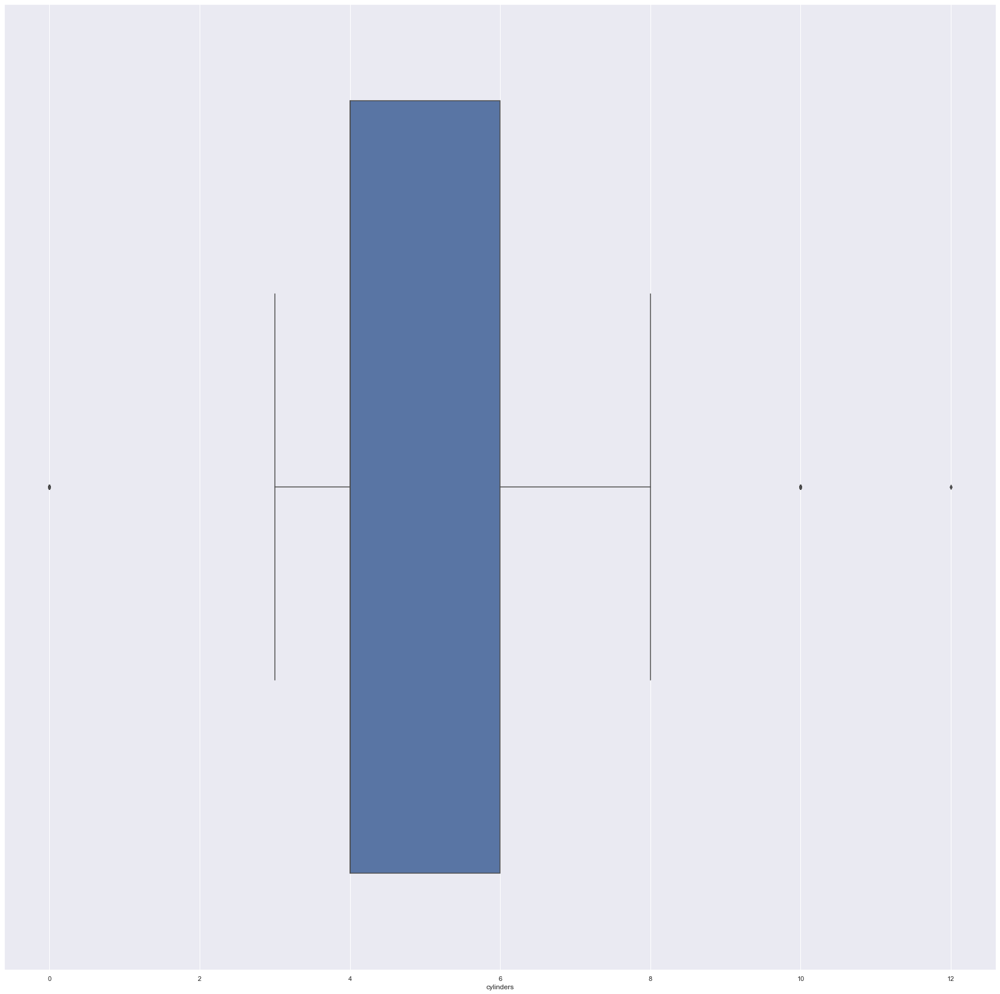

In [482]:
sns.boxplot(df['cylinders'])

In [483]:
df[(df['cylinders']==0) & (df['fuel_type']!='Electric')].head()

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
65,2021 Audi A4 40 Premium Plus,AWD,27.5,Gasoline,7-Speed Automatic,2.0L,9431,43351.0,Audi,2021,2.0,0,automatic,7.0,none,A4 40 Premium Plus
197,2021 Audi A4 40 Premium,AWD,27.5,Gasoline,7-Speed Automatic,2.0L,10512,38999.0,Audi,2021,2.0,0,automatic,7.0,none,A4 40 Premium
306,2021 Audi Q5 45 Premium,AWD,25.5,Gasoline,7-Speed Automatic,2.0L,9872,55995.0,Audi,2021,2.0,0,automatic,7.0,none,Q5 45 Premium
378,2021 Audi A4 40 Premium Plus,AWD,27.5,Gasoline,7-Speed Automatic,2.0L,10317,40500.0,Audi,2021,2.0,0,automatic,7.0,none,A4 40 Premium Plus
456,2010 Audi S5 4.2 Prestige,AWD,20.0,Gasoline,6-Speed Automatic with Tiptronic,8 Cylinder Engine,82580,22900.0,Audi,2010,0.0,0,automatic,6.0,none,S5 4.2 Prestige


## Comments:
Looks like there are some irregular ways to write the number of cylinders, lets fix it with regex.

In [484]:
df.iloc[df[(df['cylinders']==0) & (df['fuel_type']!='Electric')].index, 11]= df[(df['cylinders']==0) & (df['fuel_type']!='Electric')]['engine'].apply(lambda x : int(re.findall('[0-9]+[^a-zA-Z.\-]',x)[0].strip()) if re.findall('[0-9]+[^a-zA-Z.\-]',x) else np.nan)

In [485]:
#impute them manually
df[(df['cylinders']==0) & (df['fuel_type']!='Electric')]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
593,2019 Audi S5 Prestige,AWD,24.723955,Gasoline,Automatic,3.0 L 6,11453,58999.0,Audi,2019,3.0,0.0,automatic,NaN,none,S5 Prestige
1591,2015 Audi A3 2.0T Premium Plus,AWD,28.500000,Gasoline,S Tronic 6-Spd Dual-Clutch Automatic -inc,Engine: 2.0 TFSI 4 Cylinder 220 HP,31000,21500.0,Audi,2015,2.0,0.0,automatic,6.0,none,A3 2.0T Premium Plus


In [486]:
df.iloc[[593, 1591], 11]= [6,4]

In [487]:
df[df['cylinders'].isnull()]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
65,2021 Audi A4 40 Premium Plus,AWD,27.500000,Gasoline,7-Speed Automatic,2.0L,9431,43351.0,Audi,2021,2.0,NaN,automatic,7.0,none,A4 40 Premium Plus
197,2021 Audi A4 40 Premium,AWD,27.500000,Gasoline,7-Speed Automatic,2.0L,10512,38999.0,Audi,2021,2.0,NaN,automatic,7.0,none,A4 40 Premium
306,2021 Audi Q5 45 Premium,AWD,25.500000,Gasoline,7-Speed Automatic,2.0L,9872,55995.0,Audi,2021,2.0,NaN,automatic,7.0,none,Q5 45 Premium
378,2021 Audi A4 40 Premium Plus,AWD,27.500000,Gasoline,7-Speed Automatic,2.0L,10317,40500.0,Audi,2021,2.0,NaN,automatic,7.0,none,A4 40 Premium Plus
478,2014 Audi A4 Premium Plus,AWD,24.500000,Gasoline,8-Speed Automatic w/Tiptronic -inc,Engine: 2.0L DOHC 4-Cylinder TFSI -inc: Audi v...,89752,16799.0,Audi,2014,2.0,NaN,automatic,8.0,none,A4 Premium Plus
573,2021 Audi A4 40 Prestige,AWD,27.500000,Gasoline,7-Speed Automatic,2.0L,11615,49988.0,Audi,2021,2.0,NaN,automatic,7.0,none,A4 40 Prestige
705,2021 Audi A4 40 Premium,AWD,27.500000,Gasoline,7-Speed Automatic,2.0L,7293,43465.0,Audi,2021,2.0,NaN,automatic,7.0,none,A4 40 Premium
862,2021 Audi A4 40 Premium,AWD,27.500000,Gasoline,7-Speed Automatic,2.0L,7801,39500.0,Audi,2021,2.0,NaN,automatic,7.0,none,A4 40 Premium
957,2021 Audi Q5 45 Premium,AWD,25.500000,Gasoline,7-Speed Automatic,2.0L,4043,45982.0,Audi,2021,2.0,NaN,automatic,7.0,none,Q5 45 Premium
1218,2021 Audi A5 2.0T Premium Plus,AWD,29.500000,Gasoline,7-Speed Automatic,2.0L,10552,48339.0,Audi,2021,2.0,NaN,automatic,7.0,none,A5 2.0T Premium Plus


In [488]:
#Fix electric cars entries
df.iloc[[1857, 2250, 2600, 2809], 11]=0
df.iloc[[1857, 2250, 2600, 2809], 3]='Electric'

In [489]:
#Fix entries with weird cylinders formatting
df.iloc[[2407, 3533, 9982], 11]=[6,6,8]
df.iloc[9982, 10]=4.7

In [490]:
#the rest are all 2.0L engines which are 4 cylinders
df.iloc[df[df['cylinders'].isnull()].index, 11]=4

In [491]:
df[df['cylinders'].isnull()]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model


C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='cylinders'>

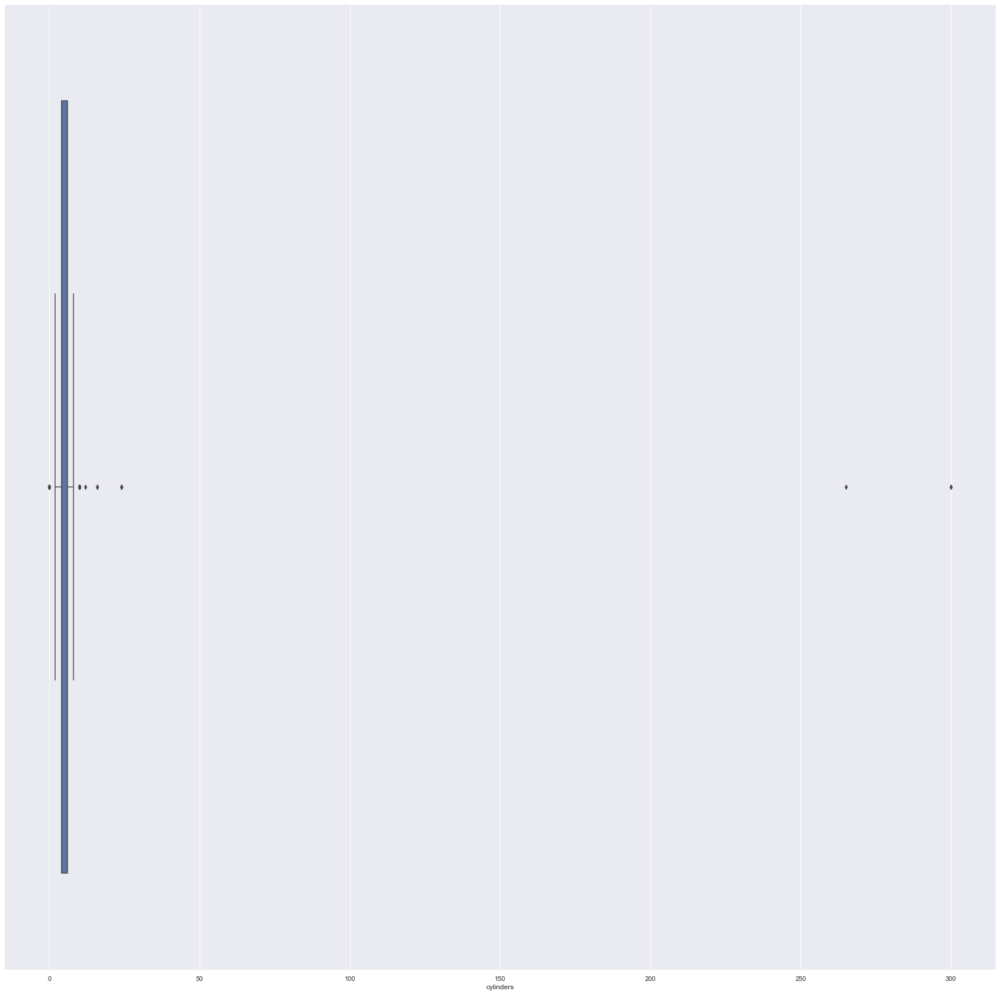

In [492]:
sns.boxplot(df['cylinders'])

In [493]:
df[df['cylinders']>12]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
3554,2012 BMW X5 35i Premium,AWD,19.5,Gasoline,8-speed Sport Automatic transmission -inc,"3.0-liter, 300-horsepower, 24-valve inline 6-c...",51296,22994.0,BMW,2012,3.0,300.0,automatic,8.0,none,X5 35i Premium
3642,2018 BMW 330 330i,RWD,29.0,Gasoline,Sport Automatic,Engine: 2.0L DOHC 16-Valve 4-Cylinder Turbocha...,24537,21998.0,BMW,2018,2.0,16.0,automatic,NaN,turbo,330 330i
4265,2013 BMW 328 i,RWD,23.0,Gasoline,6-speed STEPTRONIC automatic transmission with...,"3.0-liter dual overhead cam (DOHC), 24-valve i...",57740,16995.0,BMW,2013,3.0,24.0,automatic,6.0,none,328 i
4486,2010 BMW 328 328i,RWD,23.0,Gasoline,6-speed manual transmission,"3.0-liter dual overhead cam (DOHC), 24-valve i...",141000,6600.0,BMW,2010,3.0,24.0,manual,6.0,none,328 328i
5288,2011 BMW 328 i xDrive,AWD,21.0,Gasoline,6-speed manual transmission,"3.0-liter dual overhead cam (DOHC), 24-valve i...",52000,14800.0,BMW,2011,3.0,24.0,manual,6.0,none,328 i xDrive
6022,2011 BMW 328,AWD,21.0,Gasoline,6-speed manual transmission,"3.0-liter dual overhead cam (DOHC), 24-valve i...",49826,13995.0,BMW,2011,3.0,24.0,manual,6.0,none,328
6199,2020 BMW 330 330i,RWD,31.0,Gasoline,Sport Automatic,Engine: 2.0L DOHC 16-Valve 4-Cylinder Turbocha...,60917,33900.0,BMW,2020,2.0,16.0,automatic,NaN,turbo,330 330i
6660,2012 BMW X5 35d,AWD,22.5,Diesel,6-speed electronically controlled automatic tr...,"3.0-liter, 265-horsepower, 24-valve inline 6-c...",66618,19995.0,BMW,2012,3.0,265.0,automatic,6.0,none,X5 35d
7125,2011 BMW X5 35i Premium,AWD,19.5,Gasoline,8-speed Sport Automatic transmission with Adap...,"3.0-liter, 300-horsepower, 24-valve inline 6-c...",89215,13900.0,BMW,2011,3.0,300.0,automatic,8.0,none,X5 35i Premium


## Comments:  
AAAAHHHHHHHHHHHHHH, some errors needs to be fixed thankfully they are not that much.

In [494]:
df.iloc[df[df['cylinders']>12].index, 11]=[6,4,6,6,6,6,4,6,6]

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='cylinders'>

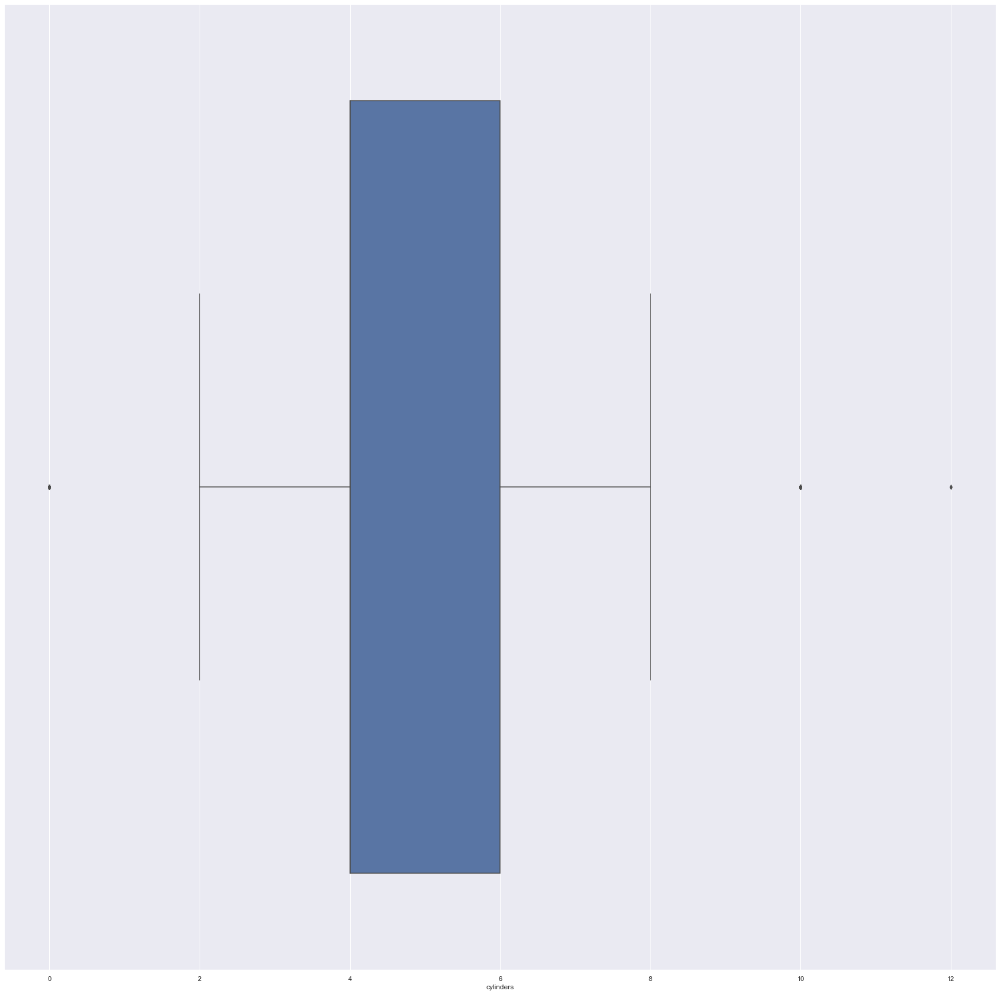

In [495]:
sns.boxplot(df['cylinders'])

In [496]:
df[df['cylinders']==0]['fuel_type'].unique()

array(['Electric'], dtype=object)

## Comments:  
everything is in order all the 0 cylinders are electric and the max is 12

## Engine_size

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='engine_size'>

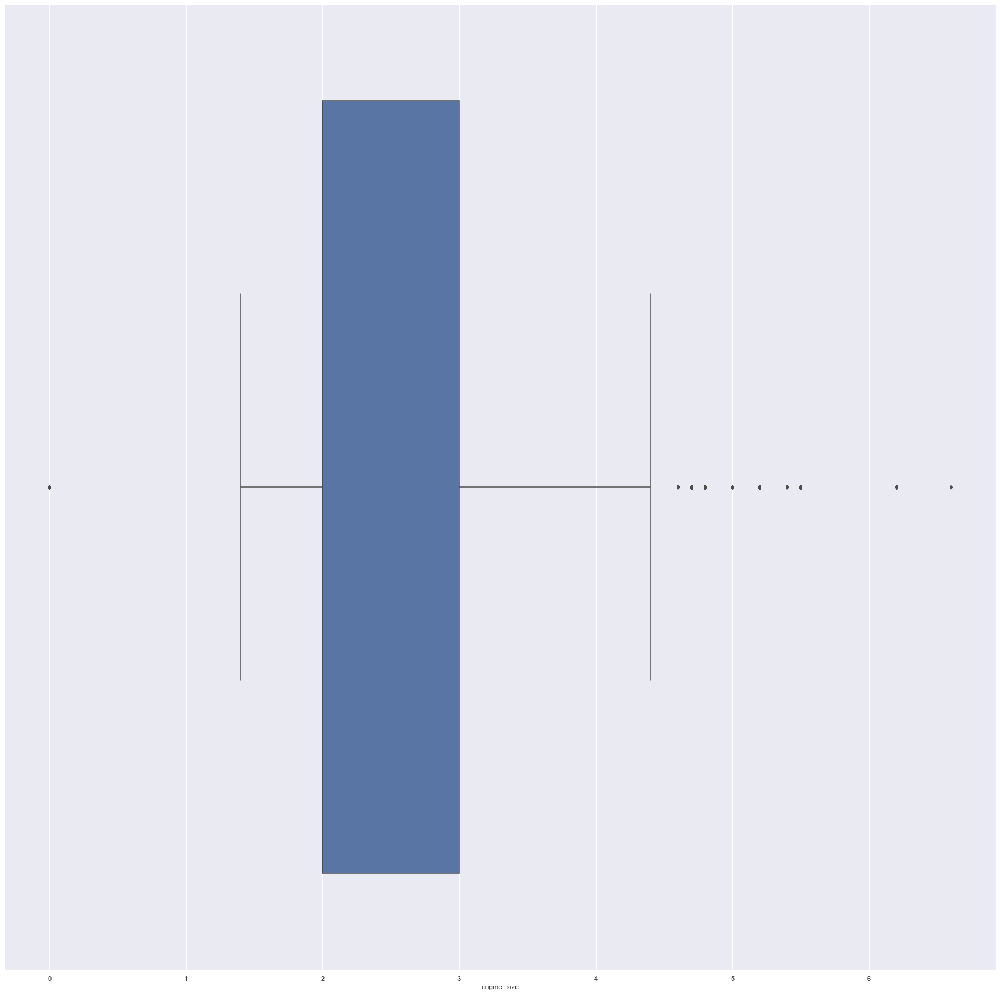

In [497]:
sns.boxplot(df['engine_size'])

In [498]:
df[(df['engine_size']==0) & (df['fuel_type']!='Electric')]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
273,2021 Audi Q3 45 S line Premium,AWD,24.0,Gasoline,7-Speed Automatic,I4,10829,39310.0,Audi,2021,0.0,4.0,automatic,7.0,none,Q3 45 S line Premium
456,2010 Audi S5 4.2 Prestige,AWD,20.0,Gasoline,6-Speed Automatic with Tiptronic,8 Cylinder Engine,82580,22900.0,Audi,2010,0.0,8.0,automatic,6.0,none,S5 4.2 Prestige
620,2019 Audi RS 5 2.9T,AWD,21.5,Gasoline,Automatic,V6 Cylinder Engine,10345,74995.0,Audi,2019,0.0,6.0,automatic,NaN,none,RS 5 2.9T
622,2021 Audi Q3 45 S line Premium,AWD,24.0,Gasoline,7-Speed Automatic,I4,10110,41590.0,Audi,2021,0.0,4.0,automatic,7.0,none,Q3 45 S line Premium
681,2021 Audi Q3 45 S line Premium,AWD,24.0,Gasoline,7-Speed Automatic,I4,2001,42660.0,Audi,2021,0.0,4.0,automatic,7.0,none,Q3 45 S line Premium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10519,2018 Mercedes-Benz C-Class C 300,RWD,28.5,Gasoline,automatic,4 Cylinder Engine,18261,35489.0,Merc,2018,0.0,4.0,automatic,NaN,none,C-Class C 300
10627,2019 Mercedes-Benz AMG GLE 43 Coupe 4MATIC,AWD,19.5,Gasoline,9-Speed Automatic,V6 Cylinder Engine,7100,74000.0,Merc,2019,0.0,6.0,automatic,9.0,none,AMG GLE 43 Coupe 4MATIC
10640,2018 Mercedes-Benz C-Class C 300,RWD,26.0,Gasoline,automatic,4 Cylinder Engine,21335,37789.0,Merc,2018,0.0,4.0,automatic,NaN,none,C-Class C 300
10643,2018 Mercedes-Benz CLA 250 Base,FWD,30.5,Gasoline,Automatic,4 Cylinder Engine,57633,26995.0,Merc,2018,0.0,4.0,automatic,NaN,none,CLA 250 Base


## Comments:  
impute with the mode for the number of cylinders based on brand, Since engine sizes are usually in increments of 0.5

In [499]:

temp= df[(df['engine_size']==0) & (df['fuel_type']!='Electric')].apply(lambda x : df[(df['brand']==x['brand'])  & (df['fuel_type']==x['fuel_type']) & (df['cylinders']==x['cylinders'])]['engine_size'].mode(), axis=1)
df.iloc[temp.index, 10]=temp[0]

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='engine_size'>

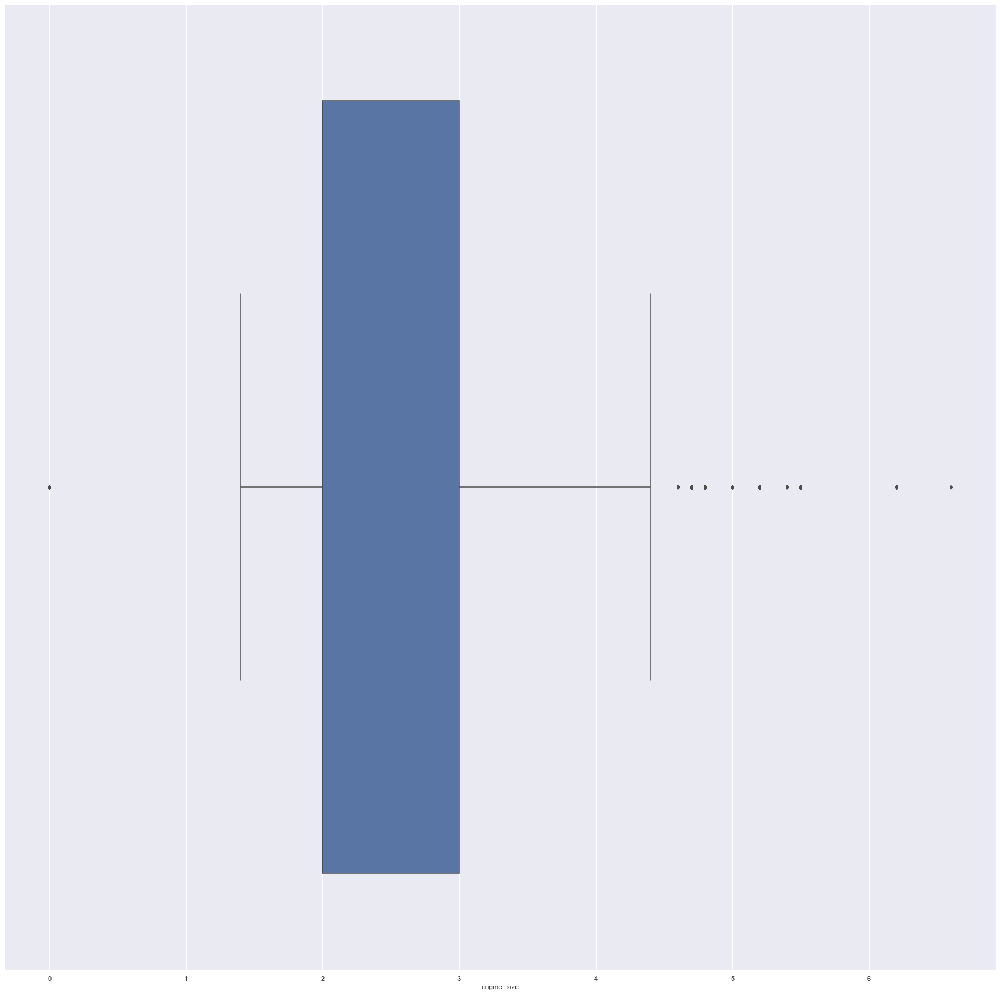

In [500]:
sns.boxplot(df['engine_size'])

In [501]:
df[(df['engine_size']==0) & (df['fuel_type']!='Electric')]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model


## Gears

In [502]:
df[df['gears'].isnull()]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
13,2018 Audi Q7 2.0T Premium Plus,AWD,21.0,Gasoline,Automatic,Intercooled Turbo Premium Unleaded I-4 2.0 L/121,51499,36900.0,Audi,2018,2.0,4.0,automatic,NaN,turbo,Q7 2.0T Premium Plus
34,2018 Audi S5 Premium Plus,AWD,15.0,Gasoline,Automatic,Intercooled Turbo Premium Unleaded V-6 3.0 L/183,23706,41995.0,Audi,2018,3.0,6.0,automatic,NaN,turbo,S5 Premium Plus
52,2014 Audi A4 2.0T Premium Plus,FWD,28.0,Gasoline,Automatic CVT,2.0L I4 16V GDI DOHC Turbo,98464,13995.0,Audi,2014,2.0,4.0,automatic,NaN,turbo,A4 2.0T Premium Plus
53,2018 Audi A5 Premium Plus,AWD,17.0,Gasoline,Automatic,Intercooled Turbo Premium Unleaded I-4 2.0 L/121,36408,34895.0,Audi,2018,2.0,4.0,automatic,NaN,turbo,A5 Premium Plus
60,2019 Audi Q8 3.0T Prestige,AWD,19.5,Gasoline,Automatic with Tiptronic,3.0L V6,5754,65962.0,Audi,2019,3.0,6.0,automatic,NaN,none,Q8 3.0T Prestige
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10640,2018 Mercedes-Benz C-Class C 300,RWD,26.0,Gasoline,automatic,4 Cylinder Engine,21335,37789.0,Merc,2018,2.0,4.0,automatic,NaN,none,C-Class C 300
10643,2018 Mercedes-Benz CLA 250 Base,FWD,30.5,Gasoline,Automatic,4 Cylinder Engine,57633,26995.0,Merc,2018,2.0,4.0,automatic,NaN,none,CLA 250 Base
10666,2019 Mercedes-Benz C-Class C 300 4MATIC,AWD,14.5,Gasoline,Automatic,Intercooled Turbo Premium Unleaded I-4 2.0 L/121,66551,44837.0,Merc,2019,2.0,4.0,automatic,NaN,turbo,C-Class C 300 4MATIC
10714,2008 Mercedes-Benz C-Class C300,RWD,18.0,Gasoline,Automatic,3.0L V6 24V MPFI DOHC,115696,8995.0,Merc,2008,3.0,6.0,automatic,NaN,none,C-Class C300


In [503]:
df.iloc[df[df['gears'].isnull()].index, 13]= np.nan

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='gears'>

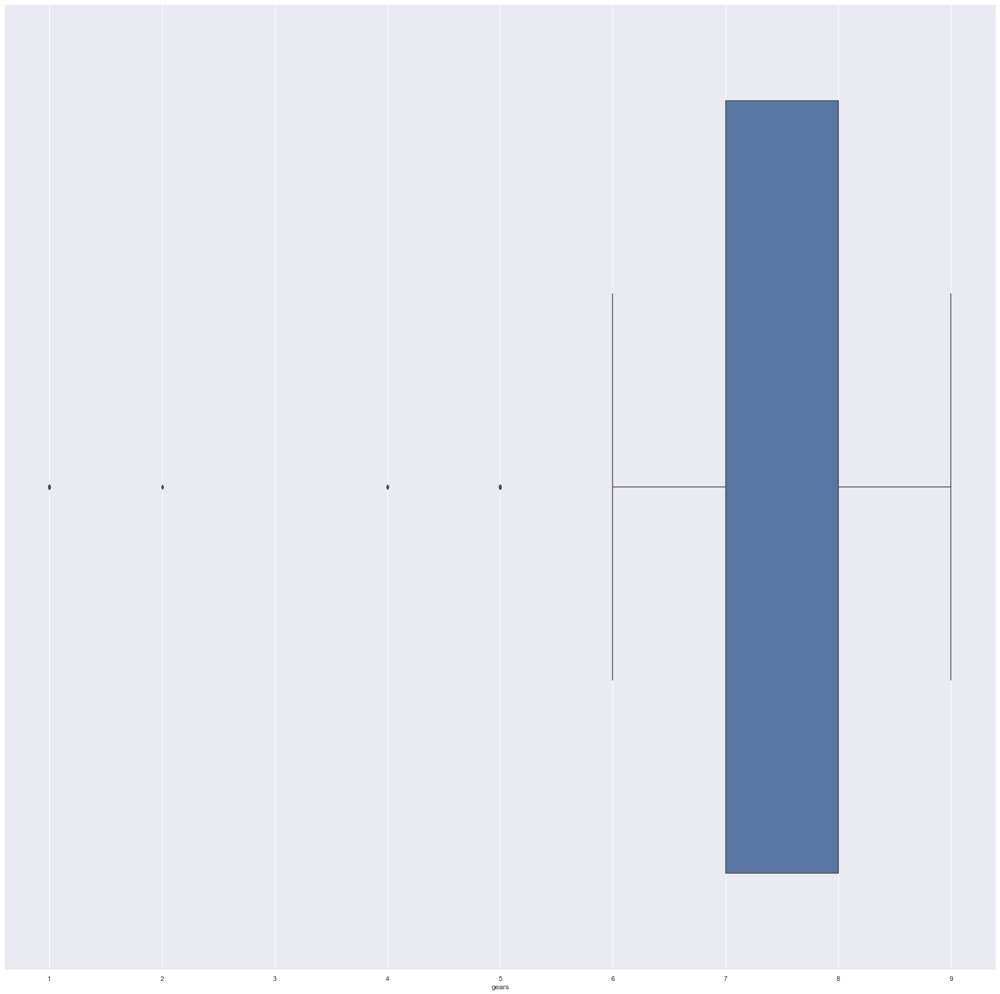

In [504]:
sns.boxplot(df['gears'])

## Comments:
The 1 and 2 are gears are for ellectric cars, some old cars uses 4 and 5 gears.  
the values will be imputed with the mode since a 3.5 gears does not make sence.
The mode will be based on year, brand, and fuel_type since the number of gears change with years and electric cars have 1 to 2 gears.

In [505]:
df.groupby(['brand','year', 'fuel_type'])[['gears']].max()


gears
brand year fuel_type       
Audi  1999 Gasoline     5.0
      2001 Gasoline     6.0
      2002 Gasoline     5.0
      2003 Gasoline     6.0
      2004 Gasoline     6.0
...                     ...
Merc  2019 Hybrid       7.0
      2020 Diesel       7.0
           Gasoline     9.0
           Hybrid       9.0
      2021 Gasoline     9.0

[117 rows x 1 columns]

In [506]:
temp= df[df['gears'].isnull()].apply( lambda x : df[ (df['brand']==x['brand']) & (df['year']==x['year']) & (df['cylinders']==x['cylinders']) ]['gears'].mode(), axis=1 )
df.iloc[df[df['gears'].isnull()].index, 13]= temp

In [507]:
df.iloc[df[df['gears'].isnull()].index, 13]=df[df['gears'].isnull()].apply( lambda x : df[ (df['brand']==x['brand']) & (df['year']==x['year'])]['gears'].mode(), axis=1 )

In [508]:
df[df['gears'].isnull()]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model


C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='gears'>

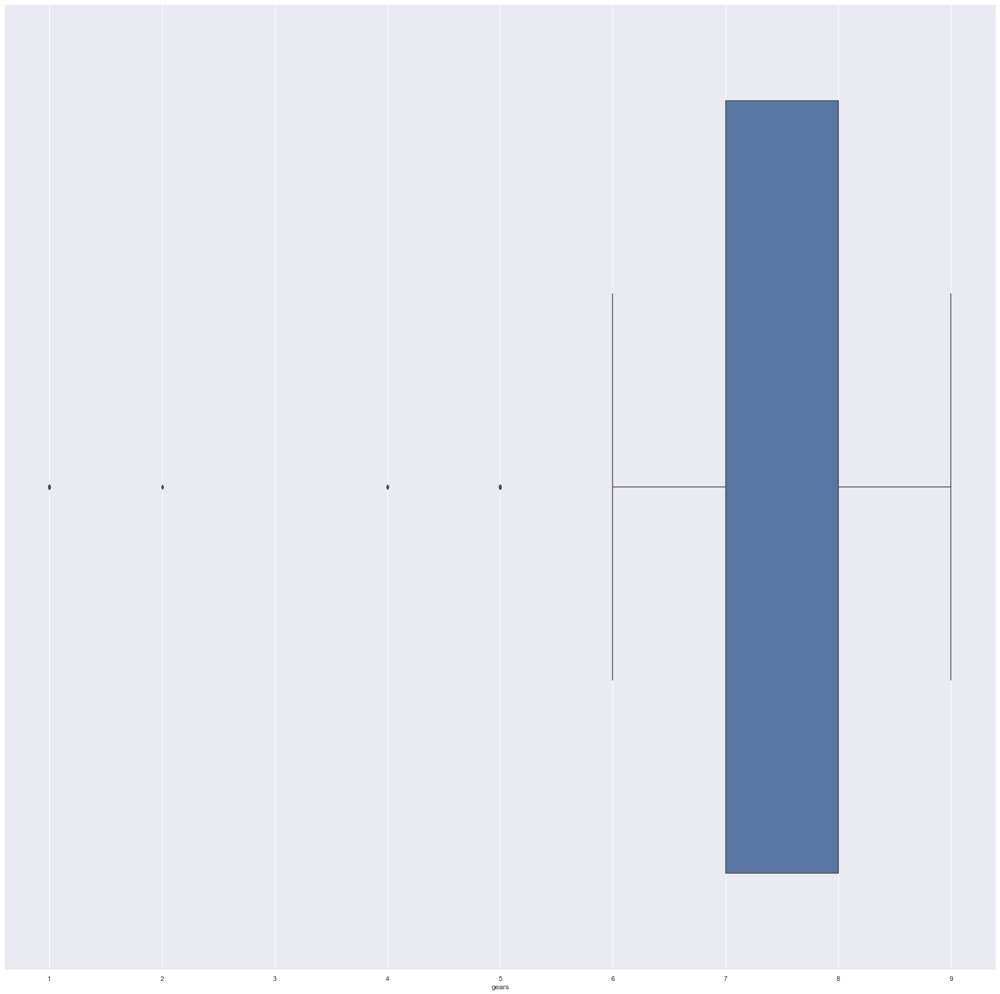

In [509]:
sns.boxplot(df['gears'])

## Boost

In [510]:
df[df['boost'].isnull()].head()

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model


## Cooments:
Cars without boost are referd to as natural aspirated engine, but for this column we will keep them as None to count for electric engines.

## Mileage

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='mileage'>

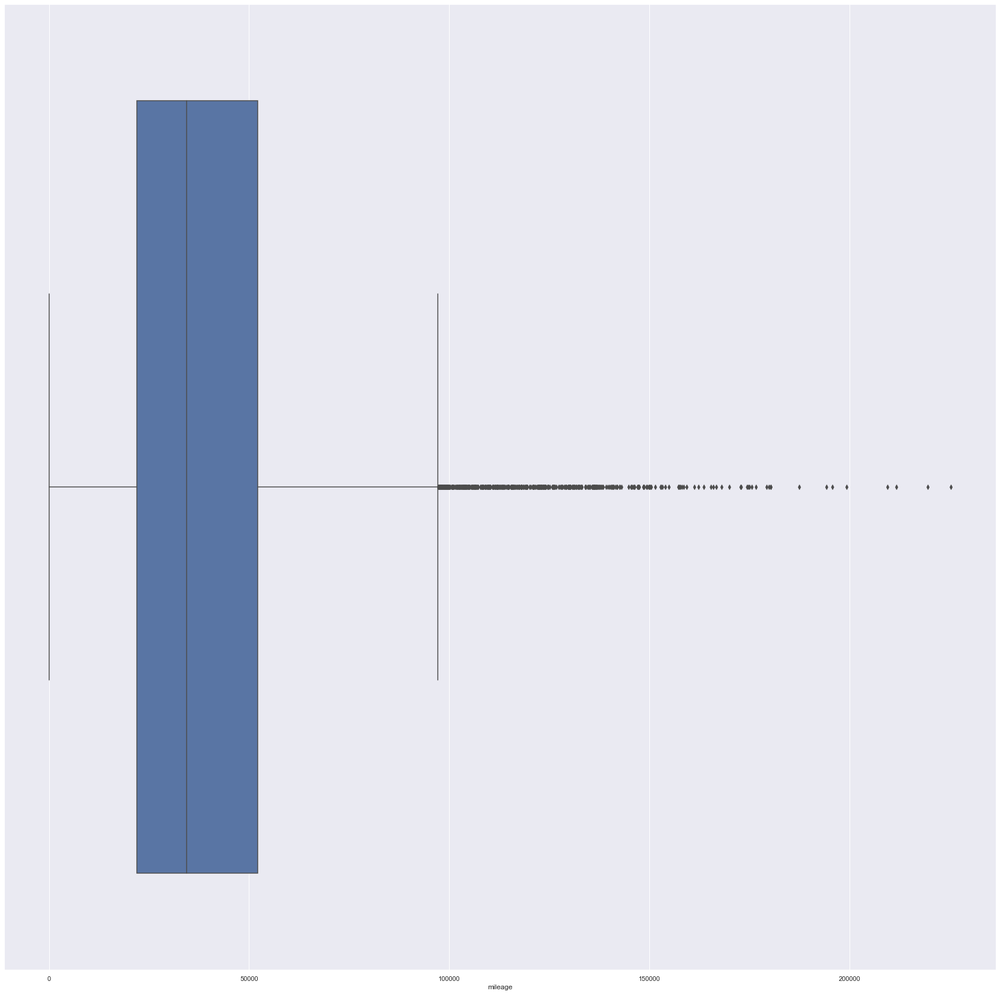

In [511]:
sns.boxplot(df['mileage'])

## Comments:  
Everything is within reason. Note: the lowest value is 112 mi not 0.

## Price

In [512]:
df[df['price'].isnull()]

,name,drivetrain,mpg,fuel_type,transmission,engine,mileage,price,brand,year,engine_size,cylinders,transmission_type,gears,boost,model
4911,2018 BMW X2 xDrive28i,AWD,26.0,Gasoline,8-Speed Automatic,2.0L I4 16V GDI DOHC Turbo,14270,NaN,BMW,2018,2.0,4.0,automatic,8.0,turbo,X2 xDrive28i
9675,2018 Mercedes-Benz GLS 450 4MATIC,AWD,19.5,Gasoline,9-Speed Automatic,3.0L V6 24V GDI DOHC Twin Turbo,34291,NaN,Merc,2018,3.0,6.0,automatic,9.0,turbo,GLS 450 4MATIC


## Comments:  
Since the target feature is missing we can't just impute the value or we might harm the model. Therefore we will drop thses rows.

In [513]:
df.drop([4911,9675], inplace=True)
df.reset_index(drop=True, inplace=True)

In [514]:
df.isnull().sum()

name                 0
drivetrain           0
mpg                  0
fuel_type            0
transmission         0
engine               0
mileage              0
price                0
brand                0
year                 0
engine_size          0
cylinders            0
transmission_type    0
gears                0
boost                0
model                0
dtype: int64

## Comments:  
Now everything is clear we can start understanding our data correctly. Before we start lets drop name, engine, and transmission columns since we extracted all the info we can from them.

In [515]:
df.drop(['name', 'transmission', 'engine'], axis=1, inplace=True)

# EDA & Visualization  
- [Correlation](#Correlation)  
- [Categorical data into numerical](#Categorical-data-into-numerical)  
- [Correlation again](#Correlation-again) 
- [Back to top](#Index)

## Correlation

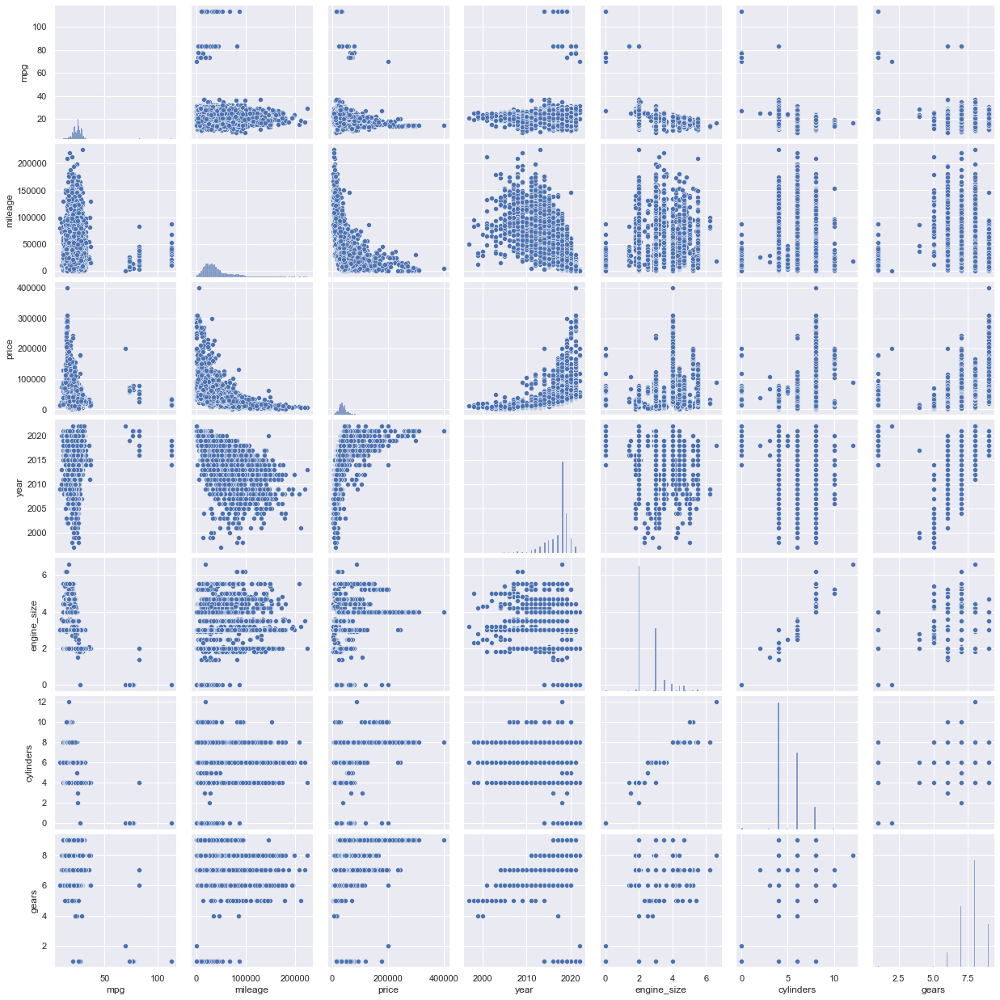

In [516]:
sns.pairplot(df)

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



[Text(0.5, 1.0, 'Year VS Price Relationship')]

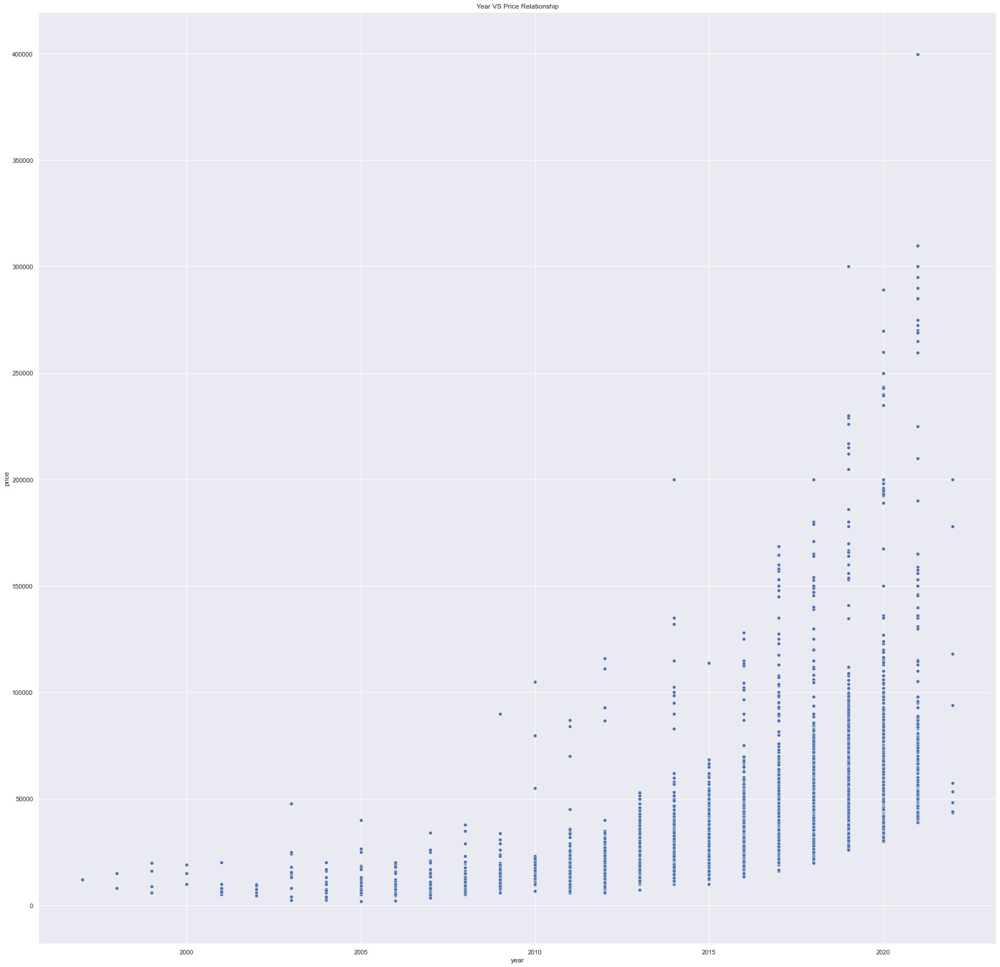

In [517]:
sns.scatterplot(df['year'], df['price']).set(title='Year VS Price Relationship')

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



[Text(0.5, 1.0, 'Milage VS Price Relationship')]

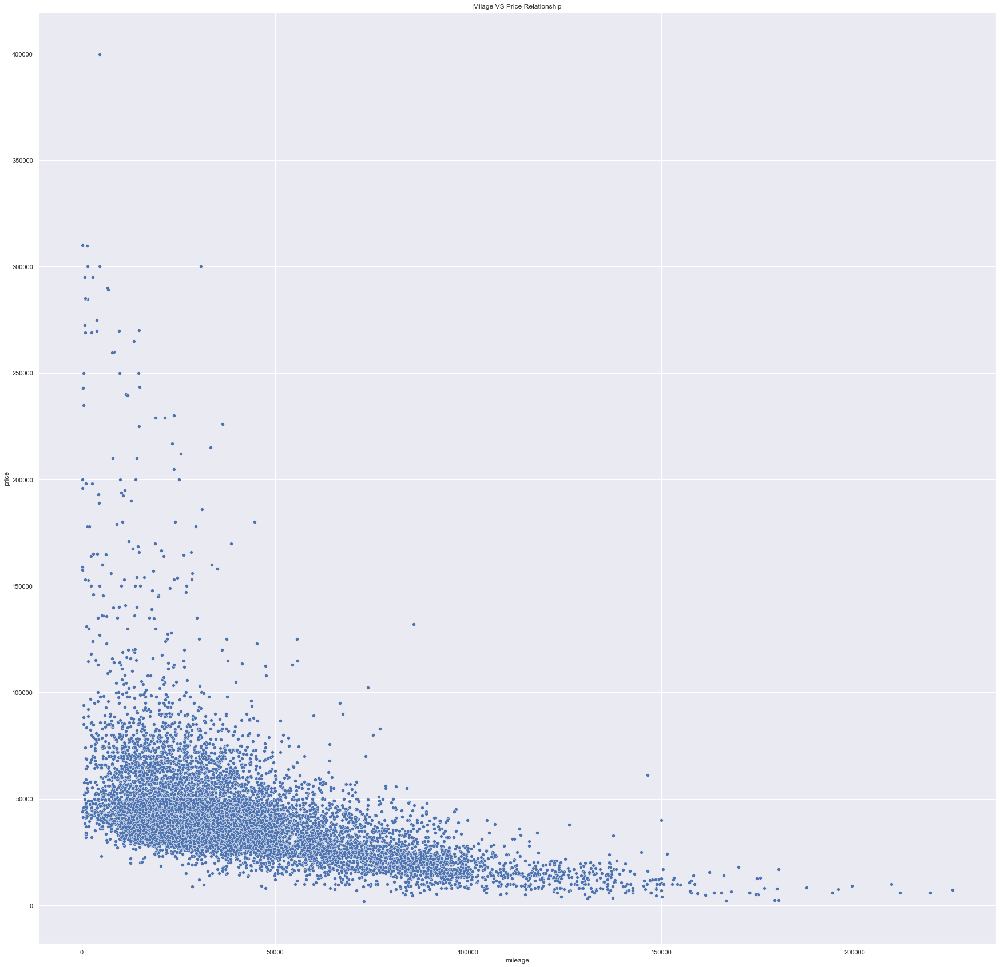

In [518]:
sns.scatterplot(df['mileage'], df['price']).set(title='Milage VS Price Relationship')

## Comments:  
We can observe that the price has a somewhat exp relation with milage and year, lets take the log base exp of the price and see if the problem gets fixed.

In [519]:
df['price_log']=np.log(df['price'])

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



[Text(0.5, 1.0, 'Year VS Price_log Relationship')]

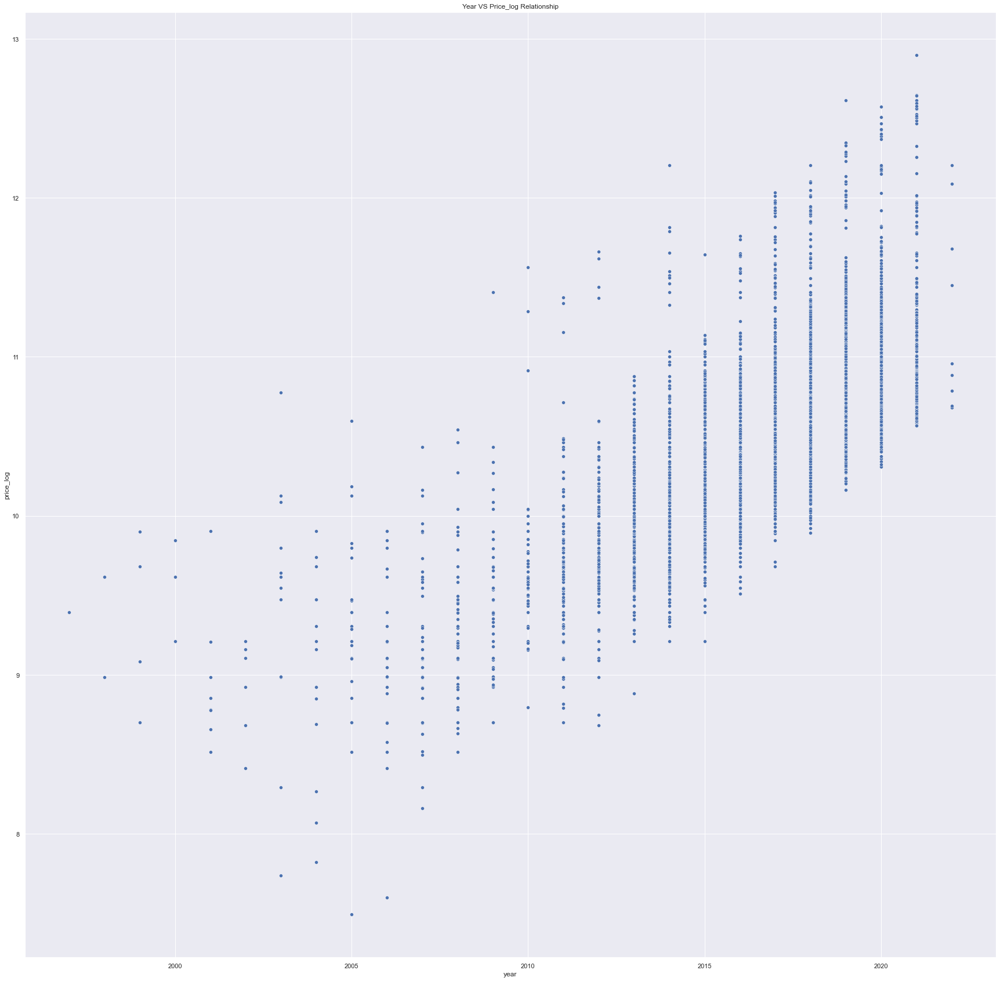

In [520]:
sns.scatterplot(df['year'], df['price_log']).set(title='Year VS Price_log Relationship')

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



[Text(0.5, 1.0, 'Milage VS Price_log Relationship')]

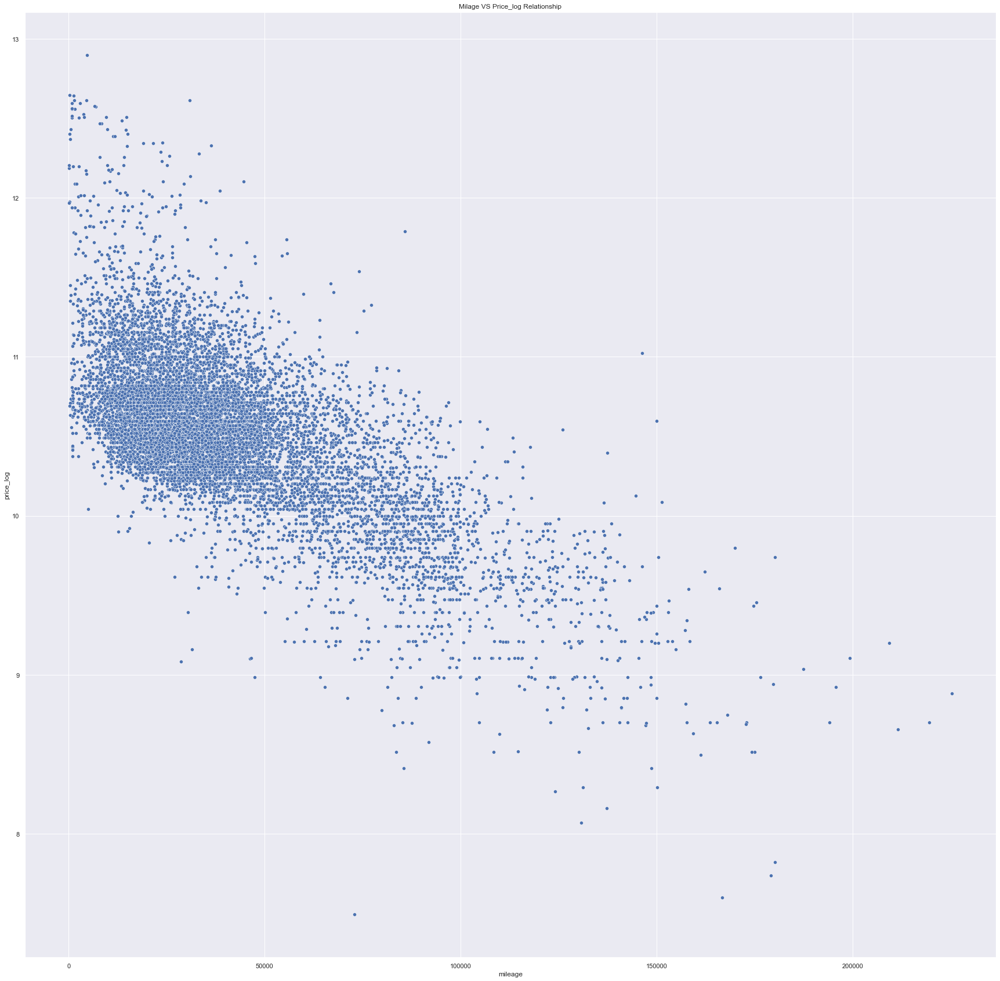

In [521]:
sns.scatterplot(df['mileage'], df['price_log']).set(title='Milage VS Price_log Relationship')

## Comments:  
That looks linear, but now to get the real price we have to use np.exp(value). Now lets convert 
categorical data into numerical.

## Categorical data into numerical

In [522]:
print(f"drivetrain: {df.drivetrain.unique()}")
print(f"fuel_type: {df.fuel_type.unique()}")
print(f"brand: {df.brand.unique()}")
print(f"transmission_type: {df.transmission_type.unique()}")
print(f"boost: {df.boost.unique()}")

drivetrain: ['AWD' 'FWD' 'RWD']
fuel_type: ['Gasoline' 'Diesel' 'Hybrid' 'Electric']
brand: ['Audi' 'BMW' 'Merc']
transmission_type: ['automatic' 'manual']
boost: ['turbo' 'supercharged' 'none']


## Comments:  
Since the categorical have few Categories

In [523]:
dummies= pd.get_dummies(df[['boost', 'transmission_type', 'brand', 'fuel_type', 'drivetrain']],drop_first=True)
df= pd.concat([df, dummies], axis=1)

## Correlation again

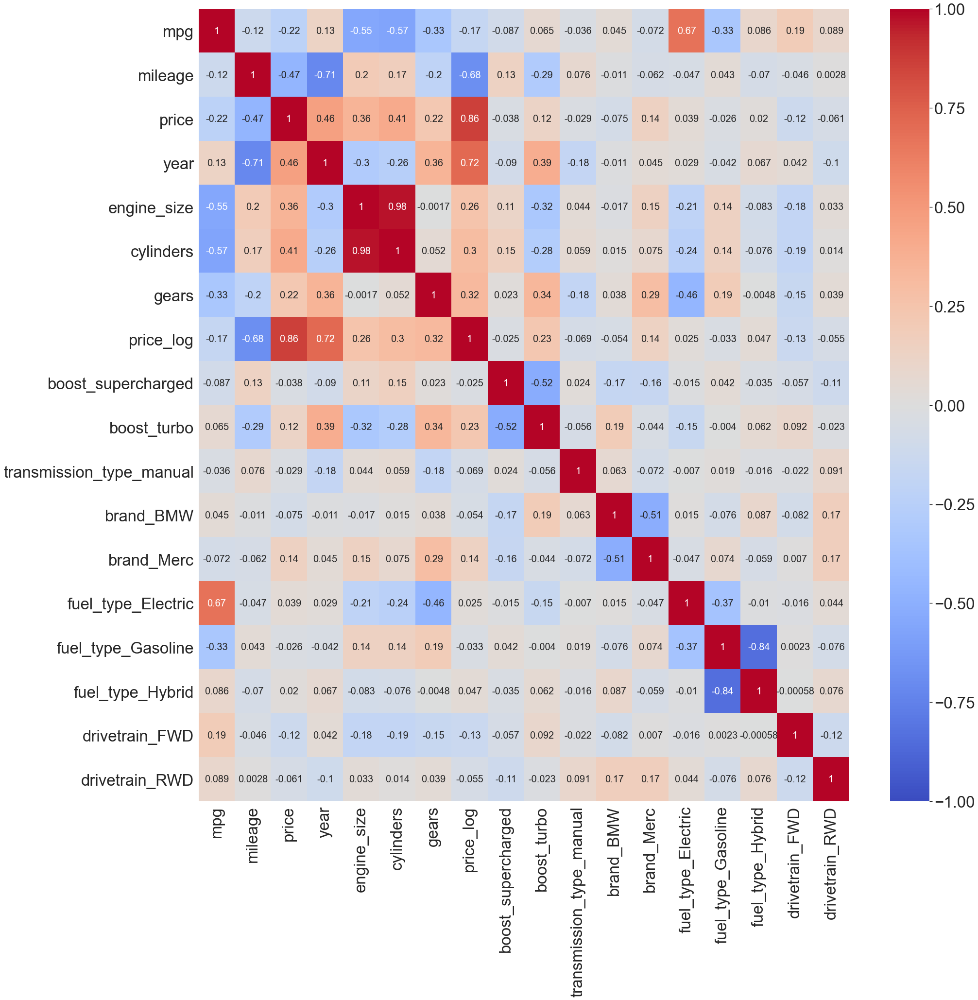

In [524]:
sns.set(font_scale=3)
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, cmap='coolwarm', annot_kws={"fontsize":20})
sns.set(rc={"figure.figsize":(30, 30)})

## Comments:
Looks like we have some features with high engine size and cylinders 0.98 which is really high
lets drop the engine size.


In [2]:
# columns to be dropped.
#df=pd.read_csv('clean_data.csv')
df.drop(['engine_size'], axis=1, inplace=True)

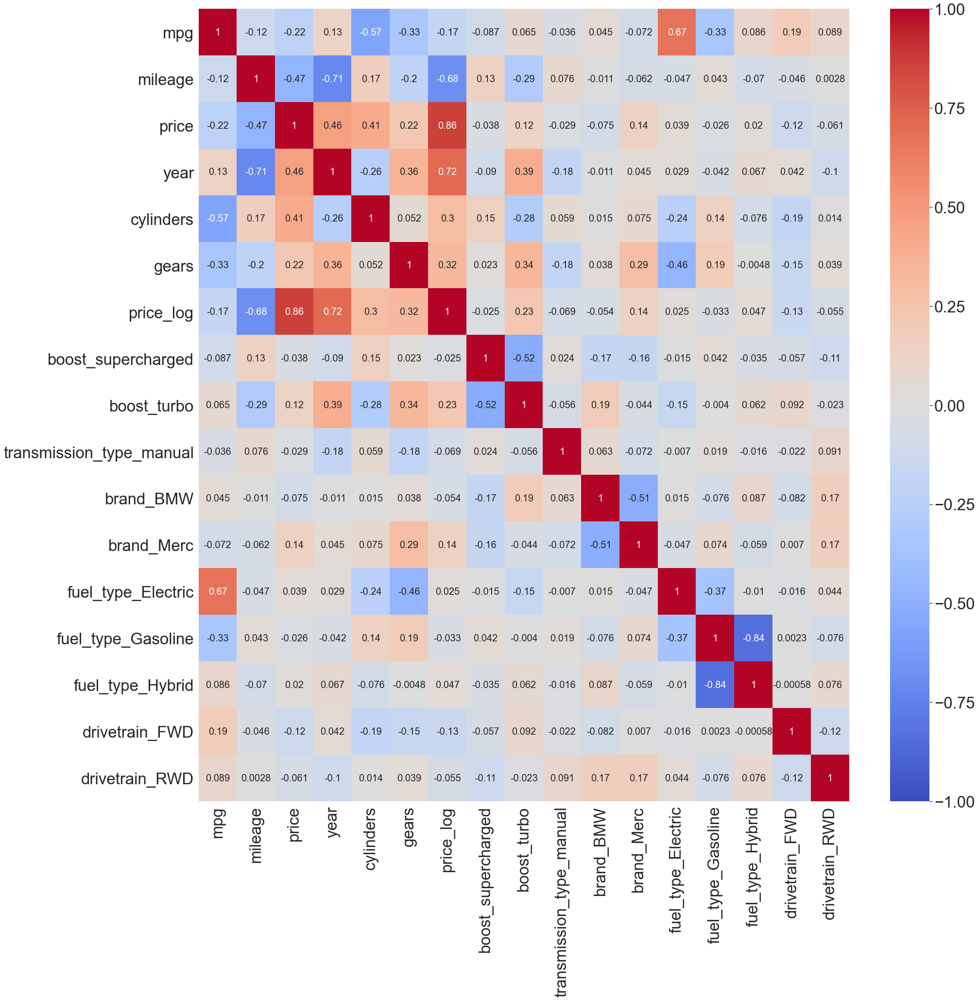

In [33]:
sns.set(font_scale=3)
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, cmap='coolwarm', annot_kws={"fontsize":20})
sns.set(rc={"figure.figsize":(30, 30)})

## Comments:
We will take a look at the price_log target and select all the features with correlation >= |0.17| to feed into the model

Text(0.5, 1.0, 'correlation between features and price_log')

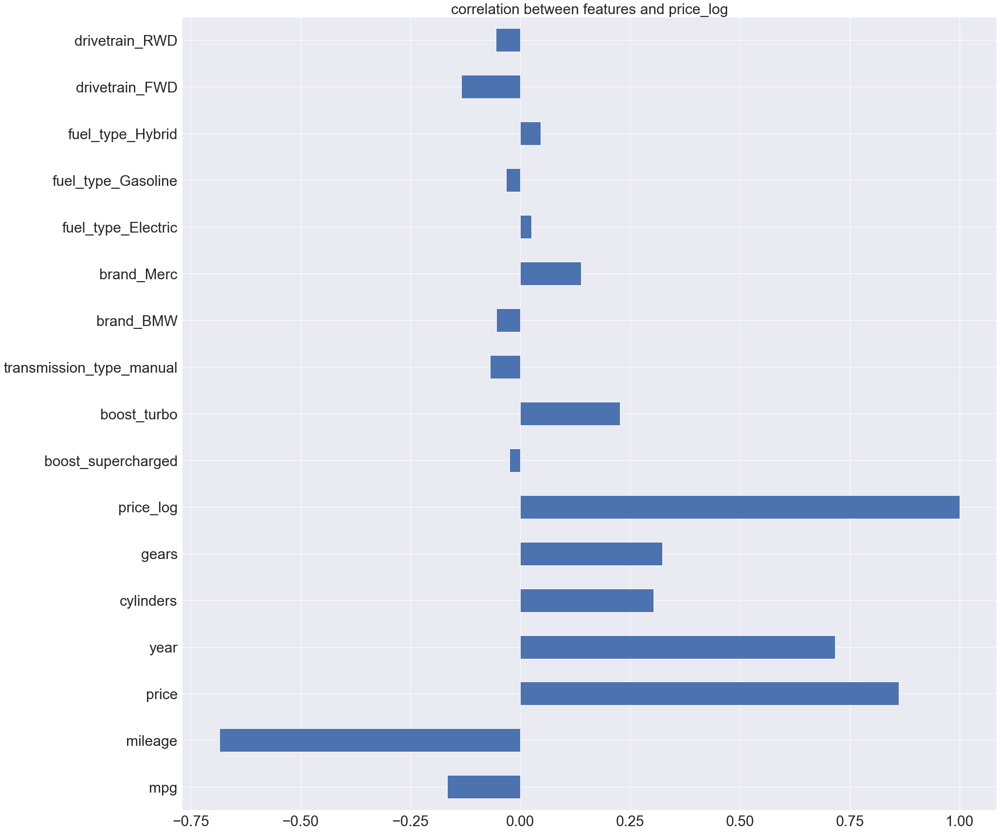

In [57]:
df.corr()['price_log'].plot(kind='barh', fontsize=30)
plt.title('correlation between features and price_log', fontsize=30)

## Comments:
Featuers to keep are:
- boost_turbo  
- gears  
- cylinders  
- year  
- mpg

## Linear Regression  
The fun part begins, building the model.  
Before we start I know it is kinda late in the notebook bu let's check for the assumptions before starting anythin.  
- [Assumption 1 Target is normally disturbuted](#Assumption-1-Target-is-normally-disturbuted)  
- [Assumption 2 Relation between target and feature is linear](#Assumption-2-Relation-between-target-and-feature-is-linear)
- [Assumption 3 no high multicollinearity](#Assumption-3-no-high-multicollinearity)  
- [Model building & evaluation](#Model-building-&-evaluation)  
- [Model building & evaluation 2](#Model-building-&-evaluation-2)  
- [Model building & evaluation 3](#Model-building-&-evaluation-3)
- [Model building & evaluation 4](#Model-building-&-evaluation-4)
- [Choosing the model](#Choosing-the-model)
- [Back to top](#Index)

## Assumption 1 Target is normally disturbuted  
Remainder: in the correlation part I transformed the price by using the np.log function to get a linear relatio with year and mileage.

C:\Users\Me\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


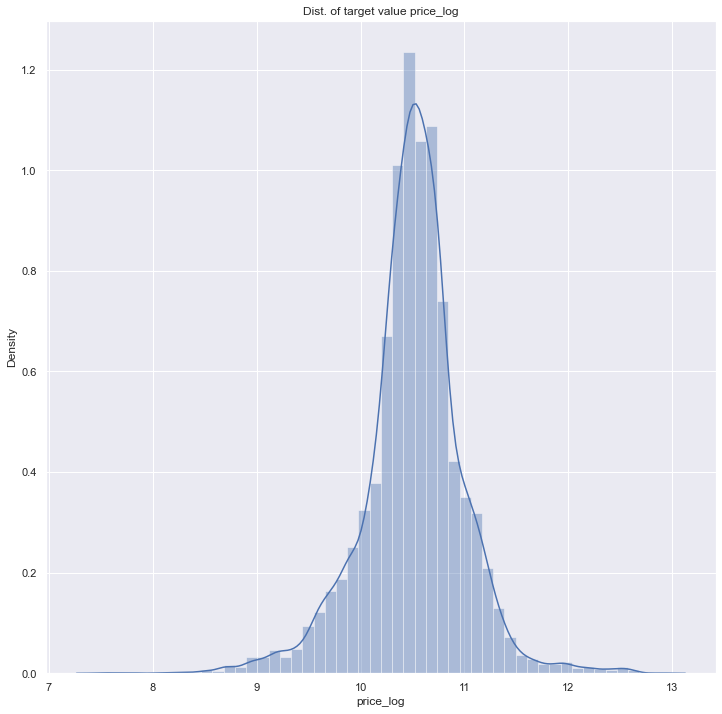

In [88]:

sns.distplot(df['price_log']).set(title='Dist. of target value price_log')
sns.set(rc={"figure.figsize":(12, 12)})

In [81]:
df['price_log'].kurtosis()

2.768804924189271

## Comments:  
Based on this [Wikipedia page about kurtosis](https://en.wikipedia.org/wiki/Kurtosis)  
 > The kurtosis of any univariate normal distribution is 3.  

If you close one eye and look sideway then 2.7 will become a 3, which means we are safe. 

## Assumption 2 Relation between target and feature is linear  
We checked for those in the correlation part and found that year and mileage have the best linear relation with price_log

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


[Text(0.5, 1.0, 'Year VS Price_log Relationship')]

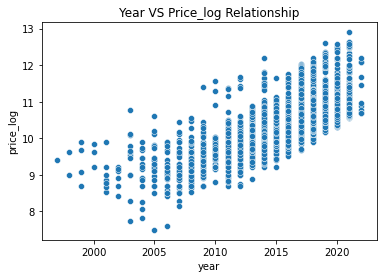

In [63]:
sns.scatterplot(df['year'], df['price_log']).set(title='Year VS Price_log Relationship')

C:\Users\Me\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


[Text(0.5, 1.0, 'Milage VS Price_log Relationship')]

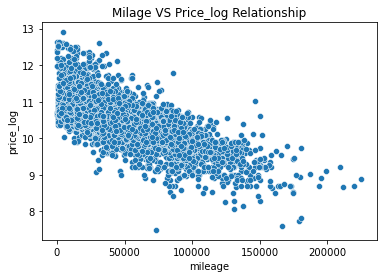

In [64]:
sns.scatterplot(df['mileage'], df['price_log']).set(title='Milage VS Price_log Relationship')

## Comments:  
Two assumptions down one to go

## Assumption 3 no high multicollinearity  
Again we checked for them in the correlation section.

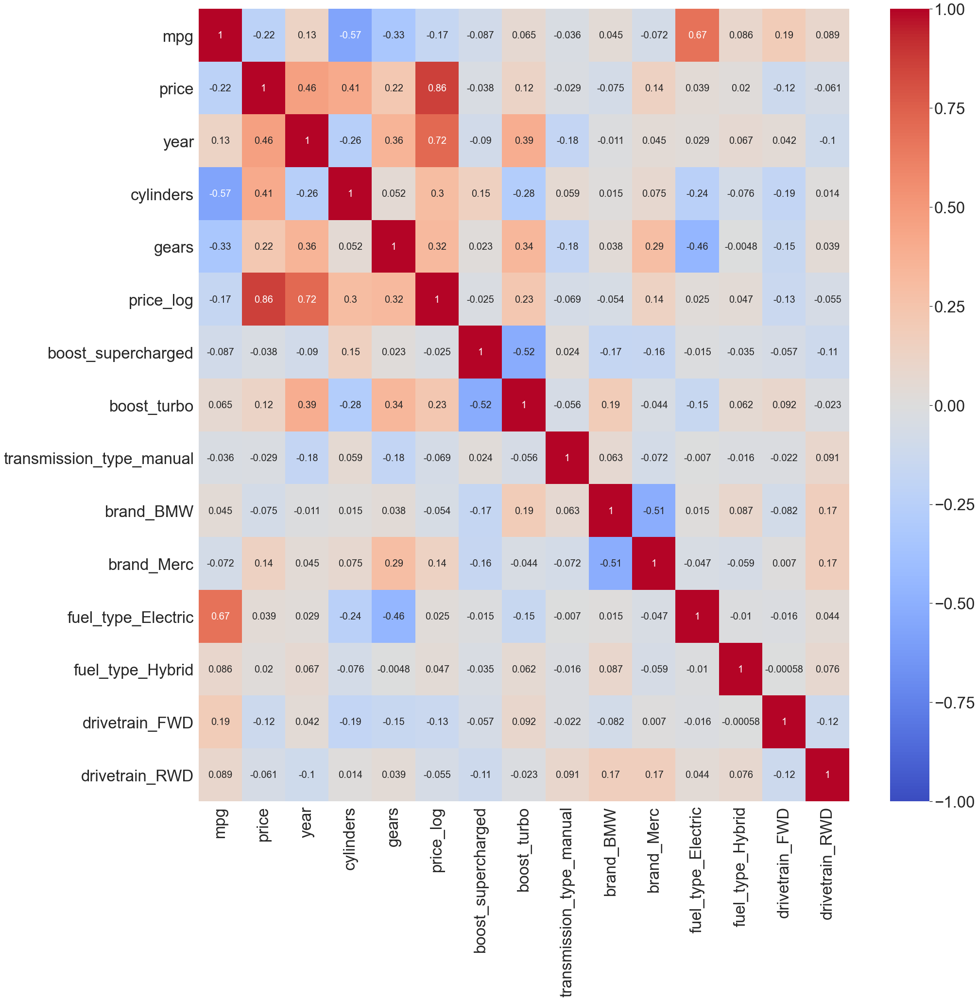

In [73]:
sns.set(font_scale=3)
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, cmap='coolwarm', annot_kws={"fontsize":20})
sns.set(rc={"figure.figsize":(30, 30)})

## Comments:  
Nothin is alarming, beside we will drop values based on the coef preasented by the model.  
Note: price will be dropped

## Model building & evaluation

In [21]:
import pandas as pd
import numpy as np
df= pd.read_csv('clean_data.csv')
df.drop('engine_size', axis=1, inplace=True)

In [22]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error

## Comments:  
[cross validation guide](https://dziganto.github.io/cross-validation/data%20science/machine%20learning/model%20tuning/python/Model-Tuning-with-Validation-and-Cross-Validation/).  
>boston = load_boston()
data = boston.data
target = boston.target
from sklearn.model_selection import cross_val_score
>
>alphas = [1e-4, 1e-3, 1e-2, 1e-1, 1, 1e1]

>val_errors = []
for alpha in alphas:
    lasso = Lasso(alpha=alpha, fit_intercept=True, random_state=77)
    errors = np.sum(-cross_val_score(lasso, 
                                     data, 
                                     y=target, 
                                     scoring='neg_mean_squared_error', 
                                     cv=10, 
                                     n_jobs=-1))
    val_errors.append(np.sqrt(errors))



In [23]:
k_folds=10
error= 'neg_mean_absolute_error' #'neg_mean_squared_error'

In [24]:
#Create a pipeline
pipe= Pipeline([("scl",MinMaxScaler()), ("lm", LinearRegression())])

#define the x and y
x= df.drop(['price', 'price_log', 'drivetrain', 'fuel_type', 'brand', 'transmission_type', 'boost', 'model'], axis=1)
y= df['price_log']

# Split into train and test
x_train1, x_test1, y_train1, y_test1 = train_test_split(x, y, test_size=0.2, random_state=42)

#Cross-val Evaluate
print(f"The mean of {error} using cross-validation is: {np.abs(cross_val_score(pipe,x, y, cv=k_folds , scoring=error)).mean()}")

#fit the model to use it if it won
pipe.fit(x_train1, y_train1);


The mean of neg_mean_absolute_error using cross-validation is: 0.12785050612214532


## Model building & evaluation 2  
The new model will use the most affecting features from the insight gained from the first model

In [25]:
coef1=pd.DataFrame(index=x.columns, data=pipe['lm'].coef_, columns=['coef']).sort_values('coef', ascending=False)
coef1

,coef
year,2.377626
cylinders,2.085800
fuel_type_Electric,1.780571
gears,0.264082
transmission_type_manual,0.234204
boost_turbo,0.142047
boost_supercharged,0.057401
fuel_type_Hybrid,0.018027
brand_Merc,0.012595
drivetrain_RWD,0.000407


## Comments:  
Hmm, from this we can see that the most important feature to consider when pricing a car is how old is it, which makes sense the newer the car the more expensive it is.  
lets build a model with all the features whose coef >= |0.1|.

In [26]:
coef1[np.abs(coef1['coef'])>=0.1]

,coef
year,2.377626
cylinders,2.085800
fuel_type_Electric,1.780571
gears,0.264082
transmission_type_manual,0.234204
boost_turbo,0.142047
drivetrain_FWD,-0.109588
fuel_type_Gasoline,-0.114181
mpg,-1.128824
mileage,-1.348315


In [27]:
#Create a pipeline
pipe2= Pipeline([("scl",MinMaxScaler()), ("lm", LinearRegression())])

#define the x and y
x= df[coef1[np.abs(coef1['coef'])>=0.1].index]
y= df['price_log']

# Split into train and test
x_train2, x_test2, y_train2, y_test2 = train_test_split(x, y, test_size=0.3, random_state=42)

#Evaluate
print(f"The mean of {error} using cross-validation is: {np.abs(cross_val_score(pipe2,x, y, cv=k_folds , scoring=error)).mean()}")

#fit the model
pipe2.fit(x_train2, y_train2);


The mean of neg_mean_absolute_error using cross-validation is: 0.13322183391169712


In [28]:
coef2=pd.DataFrame(index=x.columns, data=pipe2['lm'].coef_, columns=['coef']).sort_values('coef', ascending=False)
coef2

,coef
year,2.414558
cylinders,2.049731
fuel_type_Electric,1.800202
gears,0.310181
transmission_type_manual,0.217748
boost_turbo,0.092675
drivetrain_FWD,-0.092518
fuel_type_Gasoline,-0.113262
mpg,-1.192984
mileage,-1.345089


## Comments:  
We went from 0.1524 to 0.1570. Yeah error is higher by a tiny bit but we reduced the complexity by a lot. so over all it is an improvment.  
Now lets test a third and a final model. Now anything below |0.25| will be dropped.

## Model building & evaluation 3

In [29]:
coef2[np.abs(coef2['coef'])>=0.25]

,coef
year,2.414558
cylinders,2.049731
fuel_type_Electric,1.800202
gears,0.310181
mpg,-1.192984
mileage,-1.345089


In [30]:
#Create a pipeline
pipe3= Pipeline([("scl",MinMaxScaler()), ("lm", LinearRegression())])

#define the x and y
x= df[coef2[np.abs(coef2['coef'])>=0.25].index]
y= df['price_log']

# Split into train and test
x_train3, x_test3, y_train3, y_test3 = train_test_split(x, y, test_size=0.3, random_state=42)

#Evaluate
print(f"The mean of {error} using cross-validation is: {np.abs(cross_val_score(pipe3,x, y, cv=k_folds , scoring=error)).mean()}")


#fit the model
pipe3.fit(x_train3, y_train3);


The mean of neg_mean_absolute_error using cross-validation is: 0.13739671485039426


In [31]:
coef3=pd.DataFrame(index=x.columns, data=pipe3['lm'].coef_, columns=['coef']).sort_values('coef', ascending=False)
coef3

,coef
year,2.440515
cylinders,2.003416
fuel_type_Electric,1.864938
gears,0.365594
mpg,-1.203450
mileage,-1.373878


## Comments:
Notice how the coef of gears and transmission_type_manual increased from ~0.28 to ~0.32, this could mean that we still had some multicollinearity in the data.

## Model building & evaluation 4

In [32]:
# Now for fun lets take all features that are >= |1|
coef3[np.abs(coef3['coef'])>=1]

,coef
year,2.440515
cylinders,2.003416
fuel_type_Electric,1.864938
mpg,-1.203450
mileage,-1.373878


In [33]:
#Create a pipeline
pipe4= Pipeline([("scl",MinMaxScaler()), ("lm", LinearRegression())])

#define the x and y
x= df[coef3[np.abs(coef3['coef'])>=1].index]
y= df['price_log']

# Split into train and test
x_train4, x_test4, y_train4, y_test4 = train_test_split(x, y, test_size=0.3, random_state=42)

#Evaluate
print(f"The mean of {error} using cross-validation is: {np.abs(cross_val_score(pipe4,x, y, cv=k_folds , scoring=error)).mean()}")


#fit the model
pipe4.fit(x_train4, y_train4);

The mean of neg_mean_absolute_error using cross-validation is: 0.14046982741003594


In [34]:
coef4=pd.DataFrame(index=x.columns, data=pipe4['lm'].coef_, columns=['coef']).sort_values('coef', ascending=False)
coef4

,coef
year,2.608540
cylinders,2.002638
fuel_type_Electric,1.599328
mpg,-1.284801
mileage,-1.348297


## Comments:  
the coef did not change and loss increased, looks like this the end of the road.  
Now lets choose the best model.

## Choosing the model 
| Features numbers | mean MAE cross-val folds=10 |
|------------------|---------------------|
|     16           | 0.12781372487972137 |
|     10           | 0.1331358753948315  |
|     6            | 0.1370398566615358  |
|     5            | 0.14046982741003594 |  

We can observe that we have a trade off between MAE and number of features, the more we reduce the number of features we increase the loss function.  

Based on the [Occam's razor principle of parsimony](https://en.wikipedia.org/wiki/Occam%27s_razor), which states that:
>the simplest explanation is usually the best one.

The third model strike a good balance between low complexity and low loss. Therefore it will be the used model for prediction.

# Conclusion  
Finally, after this pai- i mean beautiful journey we get to what insight did we learn from all this work. 
- [Assumption 4 residuals are normally distributed](#Assumption-4-residuals-are-normally-distributed)  
- [Insight](#Insight)
- [Playing with the best model](#Playing-with-the-best-model)
- [Extras](#Extras)
- [Back to top](#Index)

## Assumption 4 residuals are normally distributed

C:\Users\Me\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price_log', ylabel='Density'>

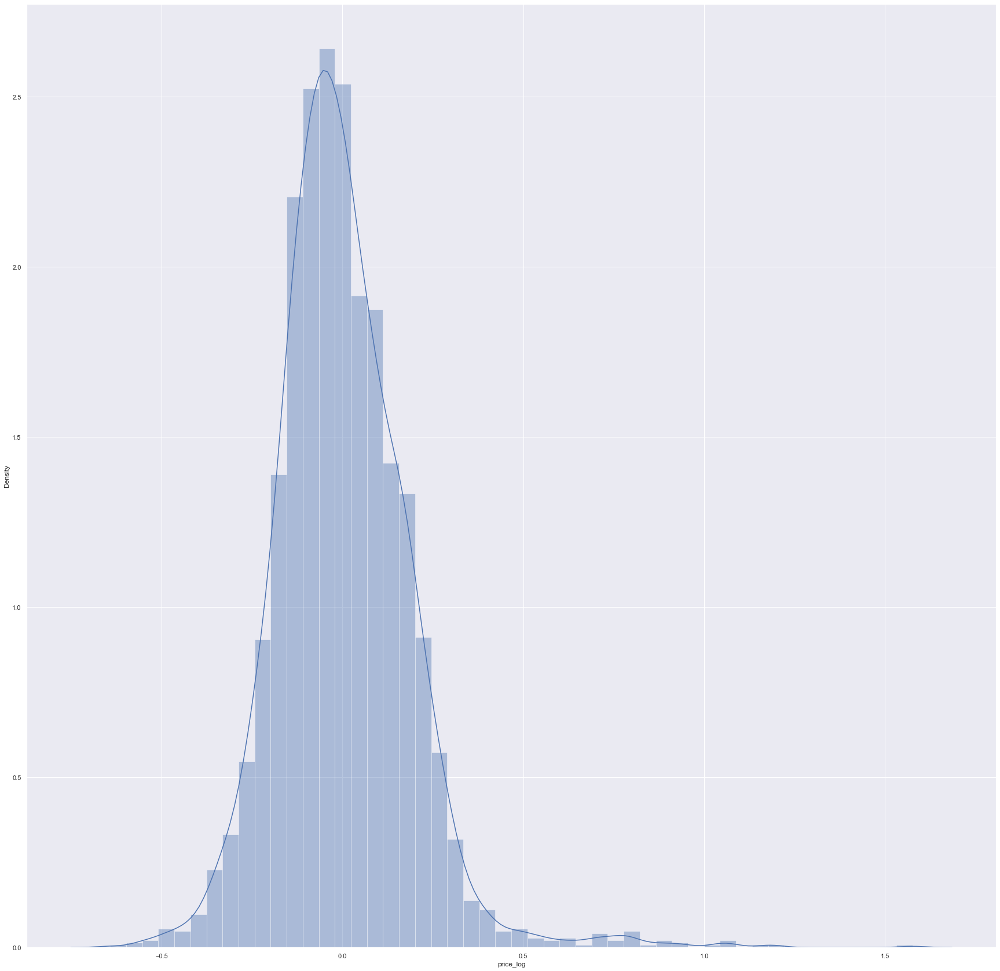

In [535]:
sns.distplot(y_test3-pipe3.predict(x_test3))

In [536]:
(y_test3-pipe3.predict(x_test3)).kurtosis()

5.801012424919028

## Insight

In [56]:
coef3

,coef
year,2.440515
cylinders,2.003416
fuel_type_Electric,1.864938
gears,0.365594
mpg,-1.203450
mileage,-1.373878


After all this what did we learn about the price? we learned that the most affecting factors are:  
1. The newer the car the more expensive it is. 
2. A great number of cylinders indicate that the car is ethier sporty or high end.  
3. Electric cars are more expensive then non-electric electric.  
4. Expensive cars have low mpg.(because they have bigger engines. see point 2)
5. The more mileage the car have the lower it price become.

## Playing with the best model  
Lets predict for this [car](https://www.cars.com/vehicledetail/f38f0403-9076-4335-9f18-02ade651e7a0/).  
We know its not in the data because we filtered by newest listing.

In [54]:
#'year', 'cylinders', 'fuel_type_Electric', 'gears', 'mpg', 'mileage'
value= pipe3.predict(np.array([[2018, 4, 0, 8, 25.5, 12405]]))
print(f"True value:{38990}$\nPredicted value:{round(np.exp(value[0]), 2)}$")

True value:38990$
Predicted value:39363.57$


Lets predict for this [car1](https://www.cargurus.com/Cars/inventorylisting/viewDetailsFilterViewInventoryListing.action?sourceContext=carGurusHomePageModel&entitySelectingHelper.selectedEntity=m3&zip=90210#listing=314391033/NONE).  
[car2](https://www.cargurus.com/Cars/inventorylisting/viewDetailsFilterViewInventoryListing.action?entitySelectingHelper.selectedEntity=m3#listing=313247851/NONE).  
From another website to make syre that it is a new unseen data point.

In [35]:
#'year', 'cylinders', 'fuel_type_Electric', 'gears', 'mpg', 'mileage'
value= pipe3.predict(np.array([[2019, 4, 0, 8, 28, 36203]]))
print(f"True value:{36998}$\nPredicted value:{round(np.exp(value[0]), 2)}$")

True value:36998$
Predicted value:36623.36$


In [84]:
#'year', 'cylinders', 'fuel_type_Electric', 'gears', 'mpg', 'mileage'
value= pipe3.predict(np.array([[2003, 6, 0, 5, 21, 78500]]))
print(f"True value:{8250}$\nPredicted value:{round(np.exp(value[0]), 2)}$")

True value:8250$
Predicted value:7335.03$


Audi  
[car1](https://www.cargurus.com/Cars/inventorylisting/viewDetailsFilterViewInventoryListing.action?entitySelectingHelper.selectedEntity=m19#listing=309892691/NONE).  
[car2](https://www.cargurus.com/Cars/inventorylisting/viewDetailsFilterViewInventoryListing.action?entitySelectingHelper.selectedEntity=d2829#listing=313964446/NONE).  

In [85]:
#'year', 'cylinders', 'fuel_type_Electric', 'gears', 'mpg', 'mileage'
value= pipe3.predict(np.array([[2019, 6, 0, 8, 19, 46082]]))
print(f"True value:{57197}$\nPredicted value:{round(np.exp(value[0]), 2)}$")

True value:57197$
Predicted value:53381.87$


In [88]:
#'year', 'cylinders', 'fuel_type_Electric', 'gears', 'mpg', 'mileage'
value= pipe3.predict(np.array([[2019, 0, 1, 1, 74, 20059]]))
print(f"True value:{59998}$\nPredicted value:{round(np.exp(value[0]), 2)}$")

True value:59998$
Predicted value:57351.06$


Merc
[car1](https://www.cargurus.com/Cars/inventorylisting/viewDetailsFilterViewInventoryListing.action?entitySelectingHelper.selectedEntity=m43#listing=310848976/NONE).  
[car2](https://www.cargurus.com/Cars/inventorylisting/viewDetailsFilterViewInventoryListing.action?entitySelectingHelper.selectedEntity=d2829#listing=313964446/NONE). 

In [89]:
#'year', 'cylinders', 'fuel_type_Electric', 'gears', 'mpg', 'mileage'
value= pipe3.predict(np.array([[2017, 8, 0, 7, 18, 17212]]))
print(f"True value:{92900}$\nPredicted value:{round(np.exp(value[0]), 2)}$")

True value:92900$
Predicted value:70097.88$


In [90]:
#'year', 'cylinders', 'fuel_type_Electric', 'gears', 'mpg', 'mileage'
value= pipe3.predict(np.array([[2020, 4, 0, 7, 21, 1507 ]]))
print(f"True value:{44314}$\nPredicted value:{round(np.exp(value[0]), 2)}$")

True value:44314$
Predicted value:51861.76$


# Extras

In [20]:
import plotly.express as px


fig = px.scatter(
    df, x='year', y='price_log', opacity=0.65,
    trendline='ols', trendline_color_override='darkblue', title='Predict price from year'
)
fig.show()

In [55]:
import plotly.graph_objects as go


a= df.drop('price', axis=1).corr()['price_log']
neg=a[a<0]
pos=a[a>0]
neg.sort_values( inplace=True)
pos.sort_values( inplace=True)
pos.drop('price_log', inplace=True)
fig = go.Figure()

fig.add_trace(go.Bar(x=neg.values, y=neg.index,
                orientation='h',
                marker_color='crimson',
                name='Negative correlation',
                     text=np.round(neg.values, 2)
                ))

fig.add_trace(go.Bar(x=pos.values, y=pos.index,
                orientation='h',
                marker_color='green',
                name='Positive correlation',
                    text=np.round(pos.values, 2)  ))
              

fig.update_traces(textposition='outside')
fig.update_layout(title_text='Features correlation with price', xaxis_title='correlation', yaxis_title='feature')

fig.show()

In [56]:
fig = go.Figure(data=go.Scatter(x=[5,6,10,16], y=[0.14046982741003594, 0.1370398566615358, 0.1331358753948315, 0.12781372487972137]))
fig.update_layout(title_text='Models loss', xaxis_title='Number of features', yaxis_title='MAE loss')
fig.show()

In [25]:
ind=['BMW1','BMW2','Audi1','Audi2','Merc1','Merc2']

fig = go.Figure(data=[
    go.Bar(name='True value', x=ind, y=[36998, 8250, 57197, 59998, 92900, 44314], text=[36998, 8250, 57197, 59998, 92900, 44314]),
    go.Bar(name='Predicted value', x=ind, y=[36623.36, 7335.03, 53381.87, 57351.06, 70097.88, 51861.76], text=[36623.36, 7335.03, 53381.87, 57351.06, 70097.88, 51861.76] )
])
# Change the bar mode
fig.update_layout(barmode='group', title_text='Predicting with the model', xaxis_title='brand',  yaxis_title='price')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.show()